Heatmaps which support top10000 reps

In [7]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import pdist
import seaborn as sns
from matplotlib import gridspec

# ─────────────── CONFIG ───────────────
max_dist       = 4
focus_alleles  = ['A*02']
highconf_list  = ['invitro', 'vatcr', 'ac02', 'random_olga', 'random_vdjdb']  # keep as you had
rep            = 'emerson_top10000'  # ⇐ set to 'emerson' or 'emerson_top10000'

base_heat_dir  = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/heatmap_output'
pgen_dir       = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/pgen'
metadata_file  = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/Repertoires/Cohort01_whole_metadata.tsv'

# ─────────────── HELPERS ───────────────
def build_maps(metadata_path, focus_alleles):
    metadata = pd.read_csv(metadata_path, sep="\t")
    filtered = metadata[
        metadata['sample_name'].str.startswith('P') &
        metadata['sample_tags'].str.contains(r'Cytomegalovirus\s+[+-]', case=False, na=False)
    ]
    if filtered.empty:
        raise ValueError("No metadata rows match CMV/sample_name filters.")

    cmv_map, hla_map = {}, {}
    for _, row in filtered.iterrows():
        pid  = row['sample_name'] + '.tsv'  # filenames like P00229.tsv
        tags = row['sample_tags']
        if 'Cytomegalovirus +' in tags:
            cmv_map[pid] = 1
        elif 'Cytomegalovirus -' in tags:
            cmv_map[pid] = 0
        else:
            continue
        hla_map[pid] = int(any(f'HLA-{allele}' in tags for allele in focus_alleles))
    return cmv_map, hla_map

def load_burden_matrix(root_dir, max_dist):
    matrix_file = os.path.join(root_dir, f'all_dist_{max_dist}_matrix.csv')
    print(f"→ Loading matrix: {matrix_file}")
    df = pd.read_csv(matrix_file, index_col='patient_id').T
    return df.apply(pd.to_numeric, errors='coerce').fillna(0.0)

def load_pgen_map(pgen_dir, highconf):
    pgen_file = os.path.join(pgen_dir, f'all_{highconf}.tsv')
    sub_df = pd.read_csv(pgen_file, sep='\t').set_index('Sequence')
    return sub_df['Pgen'].to_dict()

def order_columns(df, cmv_map, hla_map):
    total_burden = df.sum(axis=0)
    burden_sorted = total_burden.sort_values(ascending=False).index.tolist()
    focus_pos = [pid for pid in burden_sorted if hla_map.get(pid,0)==1 and cmv_map.get(pid)==1]
    focus_neg = [pid for pid in burden_sorted if hla_map.get(pid,0)==1 and cmv_map.get(pid)==0]
    other_pos = [pid for pid in burden_sorted if hla_map.get(pid,0)==0 and cmv_map.get(pid)==1]
    other_neg = [pid for pid in burden_sorted if hla_map.get(pid,0)==0 and cmv_map.get(pid)==0]
    ordered_cols = [*focus_pos, *focus_neg, *other_pos, *other_neg]
    return ordered_cols, (focus_pos, focus_neg, other_pos, other_neg)

def plot_heatmap(df, cmv_map, hla_map, pgen_map, max_dist, highconf, focus_alleles, ordered_blocks, rep_label):
    ordered_cols = df.columns.tolist()
    status_strip = [cmv_map[c] for c in ordered_cols]
    hla_strip    = [hla_map.get(c,0) for c in ordered_cols]

    if df.shape[0] >= 2:
        dist_rows   = pdist(df.values, metric='euclidean')
        Z_rows      = linkage(dist_rows, method='average')
        leaf_order  = dendrogram(Z_rows, no_plot=True)['leaves']
        df_plot     = df.iloc[leaf_order, :]
    else:
        df_plot = df

    pgen_array = [pgen_map.get(seq, np.nan) for seq in df_plot.index]

    fig = plt.figure(figsize=(18,11))
    gs  = fig.add_gridspec(3,3, height_ratios=[20,1,1], width_ratios =[20,1,1], hspace=0.02, wspace=0.05)
    ax_heat = fig.add_subplot(gs[0,0])
    ax_pgen = fig.add_subplot(gs[0,1], sharey=ax_heat)
    ax_cbar = fig.add_subplot(gs[0,2])
    ax_cmv  = fig.add_subplot(gs[1,0], sharex=ax_heat)
    ax_hla  = fig.add_subplot(gs[2,0], sharex=ax_heat)

    imshow_kwargs = dict(aspect='auto', cmap='viridis')
    if df_plot.values.size:
        imshow_kwargs.update(vmin=df_plot.values.min(), vmax=df_plot.values.max())
    im = ax_heat.imshow(df_plot.values, **imshow_kwargs)
    fig.colorbar(im, cax=ax_cbar, label=f'Cumulative burden (dist≤{max_dist})')
    ax_heat.set_yticks([]); ax_heat.set_ylabel('Sequences')
    ax_heat.set_title(f'{highconf} against {rep_label} repertoires, dist ≤ {max_dist}')
    ax_heat.set_xticks([]); ax_heat.tick_params(axis='x', which='both', length=0)

    ax_pgen.barh(np.arange(len(pgen_array)), pgen_array, align='center')
    ax_pgen.invert_yaxis()
    ax_pgen.set_xlabel('Pgen'); ax_pgen.set_xscale('log'); ax_pgen.set_yticks([])

    cmap_cmv = ListedColormap(['blue','red'])
    ax_cmv.imshow(np.array(status_strip)[None,:], aspect='auto', cmap=cmap_cmv, vmin=0, vmax=1)
    ax_cmv.set_yticks([]); ax_cmv.set_frame_on(False); ax_cmv.set_xticks([])

    cmap_hla = ListedColormap(['lightgrey','darkgreen'])
    ax_hla.imshow(np.array(hla_strip)[None,:], aspect='auto', cmap=cmap_hla, vmin=0, vmax=1)
    ax_hla.set_yticks([]); ax_hla.set_frame_on(False); ax_hla.set_xticks([])

    focus_pos, focus_neg, other_pos, other_neg = ordered_blocks
    cuts = np.cumsum([len(focus_pos), len(focus_neg), len(other_pos), len(other_neg)])
    for c in cuts[:-1]:
        for ax in (ax_heat, ax_cmv, ax_hla):
            ax.axvline(c-0.5, color='white', lw=1.5)

    leg_cmv = [mpatches.Patch(color=cmap_cmv(0), label='CMV–'),
               mpatches.Patch(color=cmap_cmv(1), label='CMV+')]
    leg_hla = [mpatches.Patch(color=cmap_hla(0), label='Other HLA'),
               mpatches.Patch(color=cmap_hla(1), label='Focus HLA')]
    fig.legend(handles=leg_cmv + leg_hla, loc='center left', bbox_to_anchor=(0.98,0.2))
    fig.text(0.995, 0.35, "Focus HLAs:\n" + "\n".join(focus_alleles),
             fontsize=8, va='top', ha='left',
             bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))
    plt.show()

def plot_summary_panel(df, cmv_map, hla_map, highconf, rep_label):
    total_burden = df.sum(axis=0)
    summary = pd.DataFrame({'patient_id': total_burden.index, 'total_burden': total_burden.values})
    summary['cmv_status'] = summary['patient_id'].map(lambda pid: 'pos' if cmv_map[pid] == 1 else 'neg')
    summary['hla_group']  = summary['patient_id'].map(lambda pid: 'focus' if hla_map.get(pid, 0) == 1 else 'other')
    summary['group'] = summary['hla_group'].str.capitalize() + ' / CMV ' + summary['cmv_status'].str.upper()
    group_order = ['Focus / CMV POS', 'Focus / CMV NEG', 'Other / CMV POS', 'Other / CMV NEG']
    summary['group'] = pd.Categorical(summary['group'], categories=group_order, ordered=True)

    stats = summary.groupby('group', observed=True)['total_burden'].agg(
        count='count', mean='mean', median='median', std='std', min='min', max='max'
    ).reset_index()
    stats_display = stats.copy()
    stats_display.iloc[:, 1:] = stats_display.iloc[:, 1:].round(3)

    vals = summary['total_burden'].dropna().to_numpy()
    y_lo, y_hi = (vals.min() - 0.05*(vals.max()-vals.min()), vals.max() + 0.05*(vals.max()-vals.min())) if vals.size else (0, 1)

    fig = plt.figure(figsize=(14, 10))
    gs = gridspec.GridSpec(2, 2, height_ratios=[4, 1])
    ax_box    = fig.add_subplot(gs[0, 0])
    ax_violin = fig.add_subplot(gs[0, 1], sharey=ax_box)
    ax_table  = fig.add_subplot(gs[1, :])

    sns.boxplot(data=summary, x='group', y='total_burden', order=group_order, ax=ax_box)
    ax_box.set_ylim(y_lo, y_hi)
    ax_box.set_title(f'Box Plot of Total Burden by Group ({rep_label})')
    ax_box.tick_params(axis='x', rotation=45)

    sns.violinplot(data=summary, x='group', y='total_burden', order=group_order, cut=0, inner='box', ax=ax_violin)
    ax_violin.set_ylim(y_lo, y_hi)
    ax_violin.set_title('Violin Plot of Total Burden by Group')
    ax_violin.tick_params(axis='x', rotation=45)

    ax_table.axis('off')
    table = ax_table.table(cellText=stats_display.values,
                           colLabels=stats_display.columns,
                           cellLoc='center', loc='center')
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1, 1.4)
    plt.suptitle(f'Total burden of {highconf} against {rep_label}', fontsize=14, y=0.94)
    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plt.show()

# ─────────────── MAIN LOOP ───────────────
cmv_map_all, hla_map_all = build_maps(metadata_file, focus_alleles)

rep_suffix = f'_{rep}' if not rep.endswith('_emerson') and rep != 'emerson' else '_emerson'
rep_label  = rep.replace('_', ' ')

for highconf in highconf_list:
    print(f"\n=== {highconf.upper()} ({rep}) ===")
    # Load the correct matrix folder, e.g. {base_heat_dir}/{highconf}_emerson_top10000
    matrix_root = os.path.join(base_heat_dir, f'{highconf}_{rep}')
    df = load_burden_matrix(matrix_root, max_dist)

    # Keep only patients present in metadata mapping
    keep = [pid for pid in df.columns if pid in cmv_map_all]
    df = df[keep]

    # Order columns and plot
    ordered_cols, blocks = order_columns(df, cmv_map_all, hla_map_all)
    df = df[ordered_cols]

    pgen_map = load_pgen_map(pgen_dir, highconf)
    plot_heatmap(df, cmv_map_all, hla_map_all, pgen_map, max_dist, highconf, focus_alleles, blocks, rep_label)
    plot_summary_panel(df, cmv_map_all, hla_map_all, highconf, rep_label)



=== INVITRO (emerson_top10000) ===
→ Loading matrix: /Users/ishaharris/Projects/TCR/TCR-Isha/data/heatmap_output/invitro_emerson_top10000/all_dist_4_matrix.csv


FileNotFoundError: [Errno 2] No such file or directory: '/Users/ishaharris/Projects/TCR/TCR-Isha/data/heatmap_output/invitro_emerson_top10000/all_dist_4_matrix.csv'

Hopefully one huge reuseable heatmap generator


=== INVITRO (emerson_top10000) ===


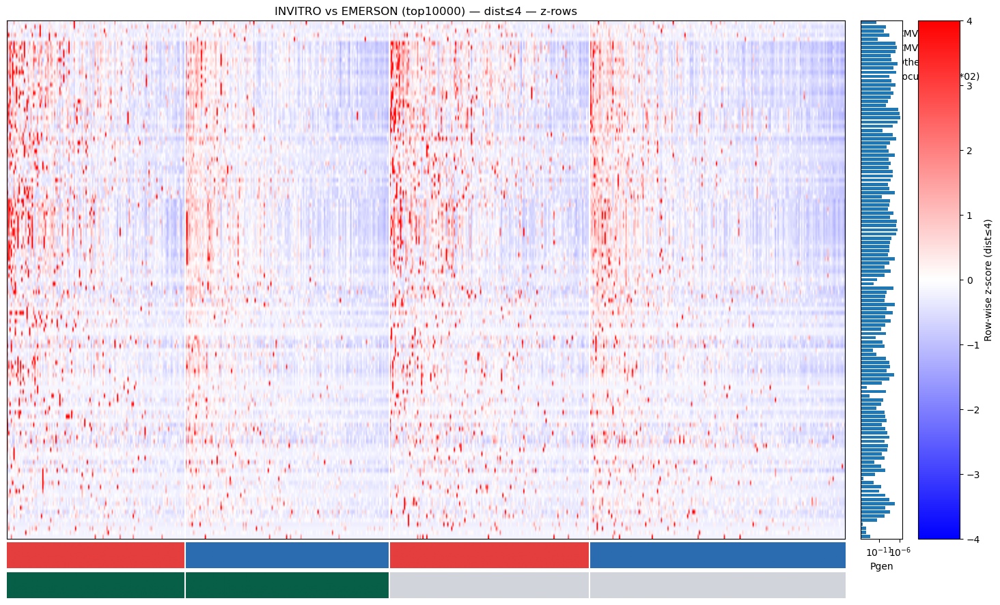

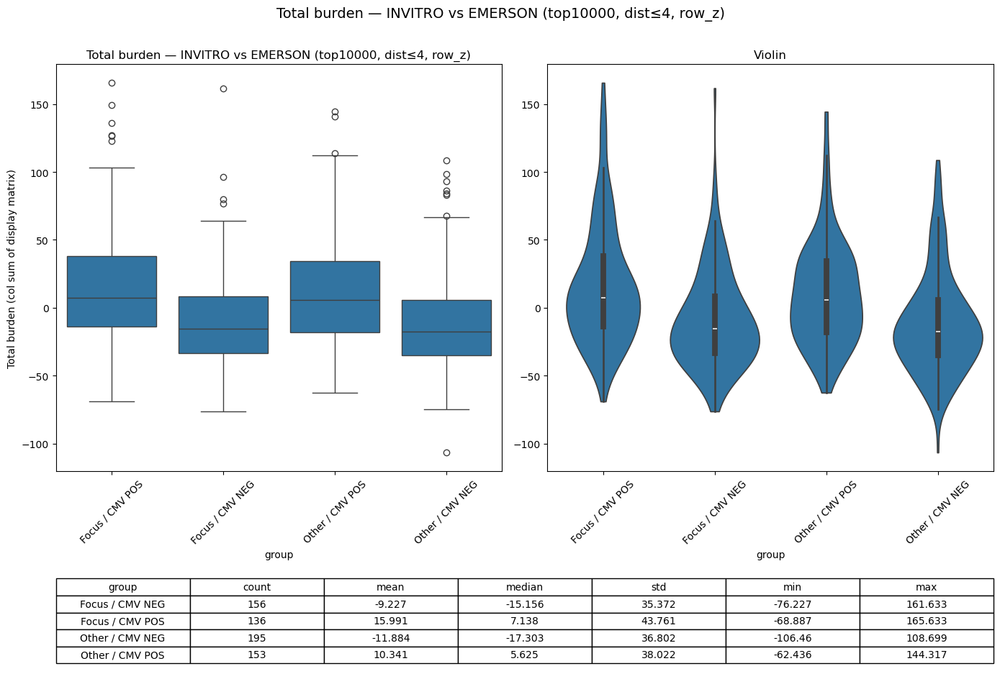


=== VATCR (emerson_top10000) ===


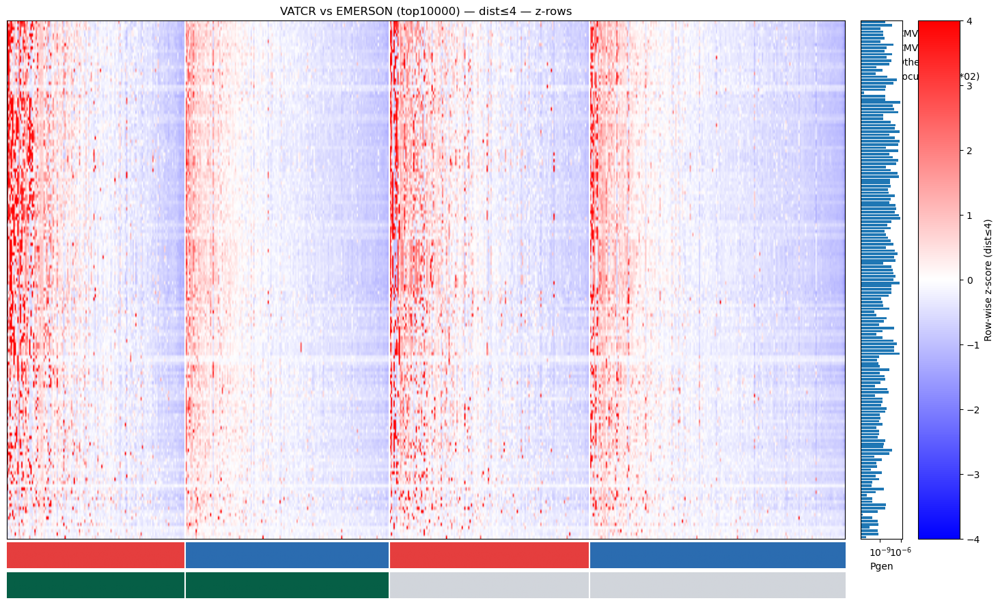

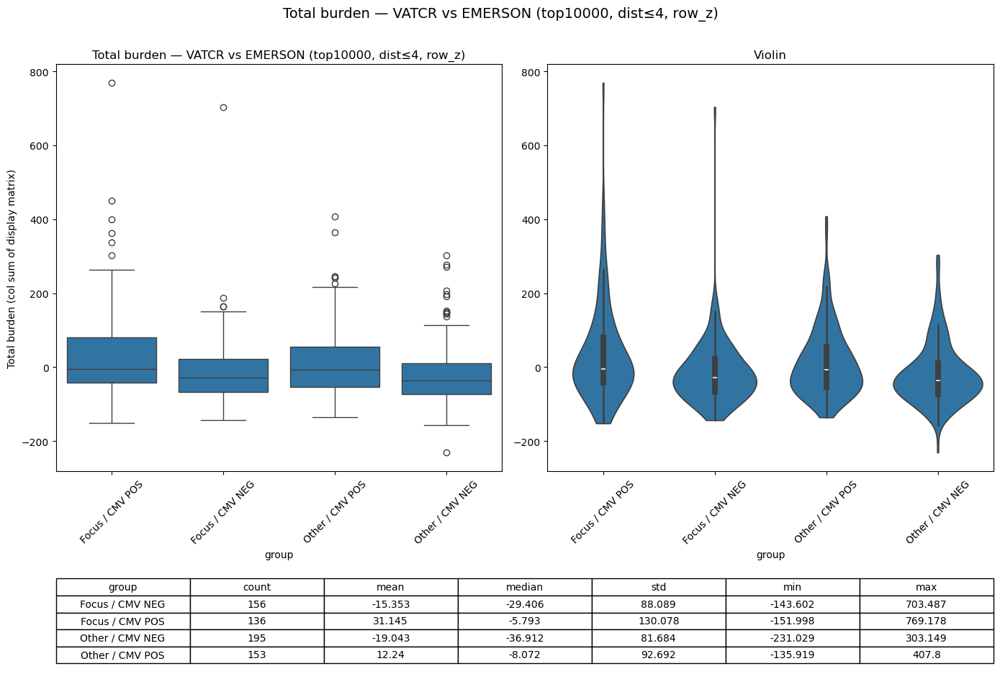


=== AC02 (emerson_top10000) ===


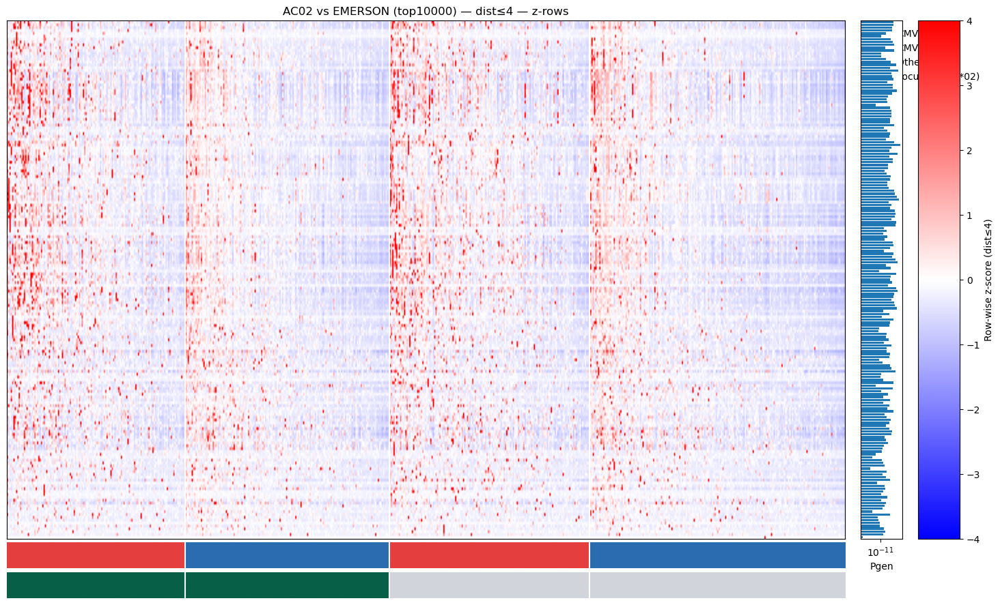

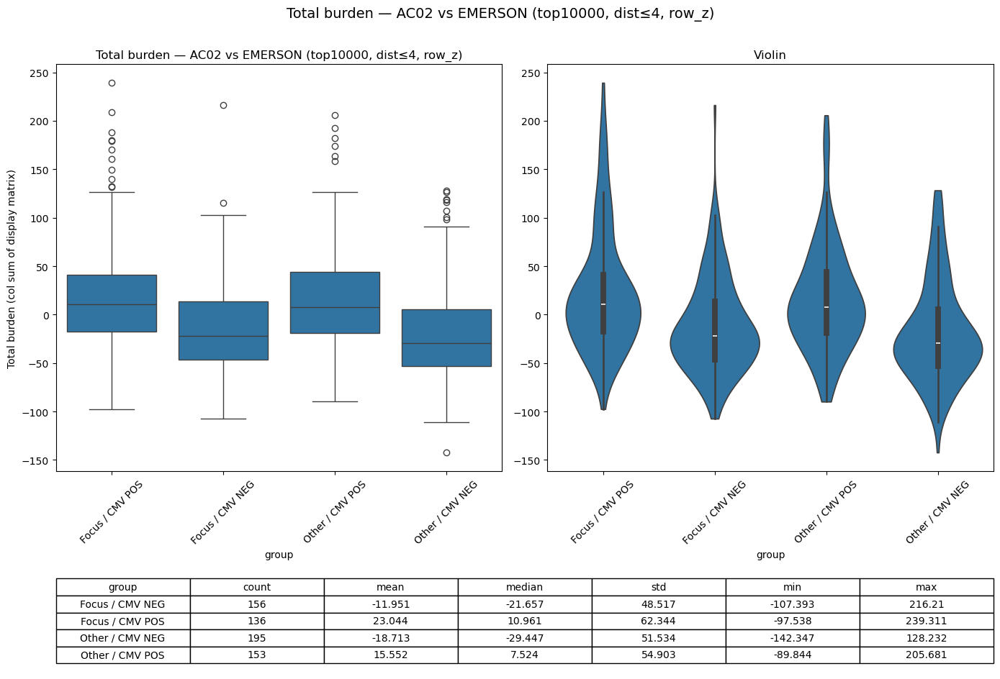


=== RANDOM_OLGA (emerson_top10000) ===


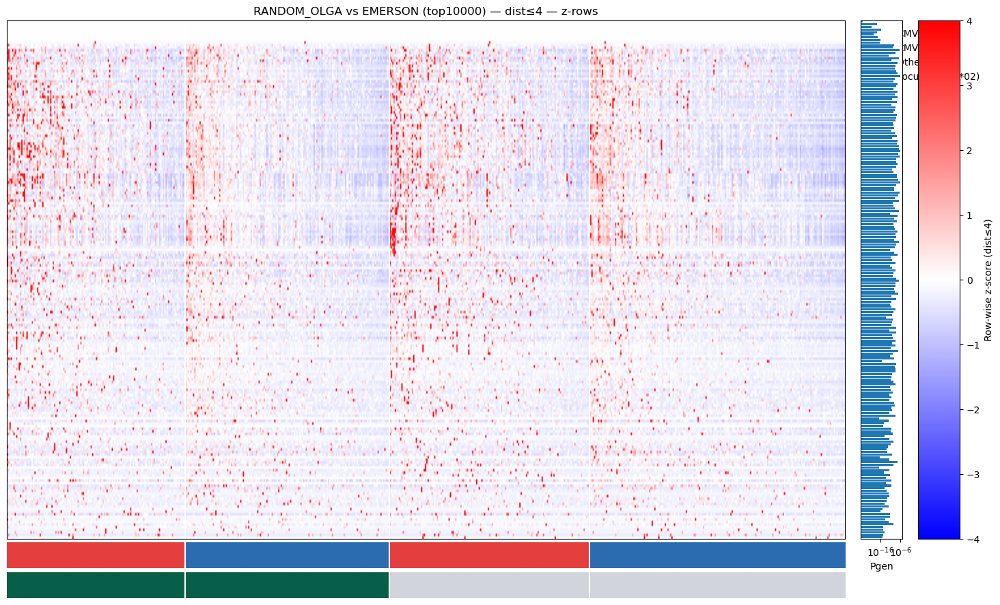

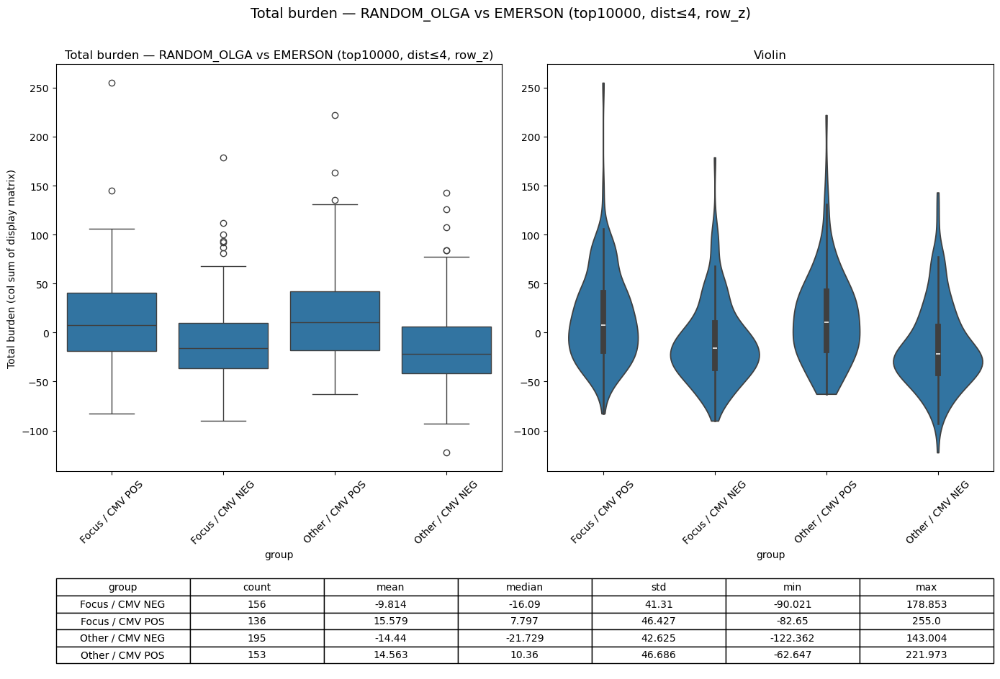


=== RANDOM_VDJDB (emerson_top10000) ===


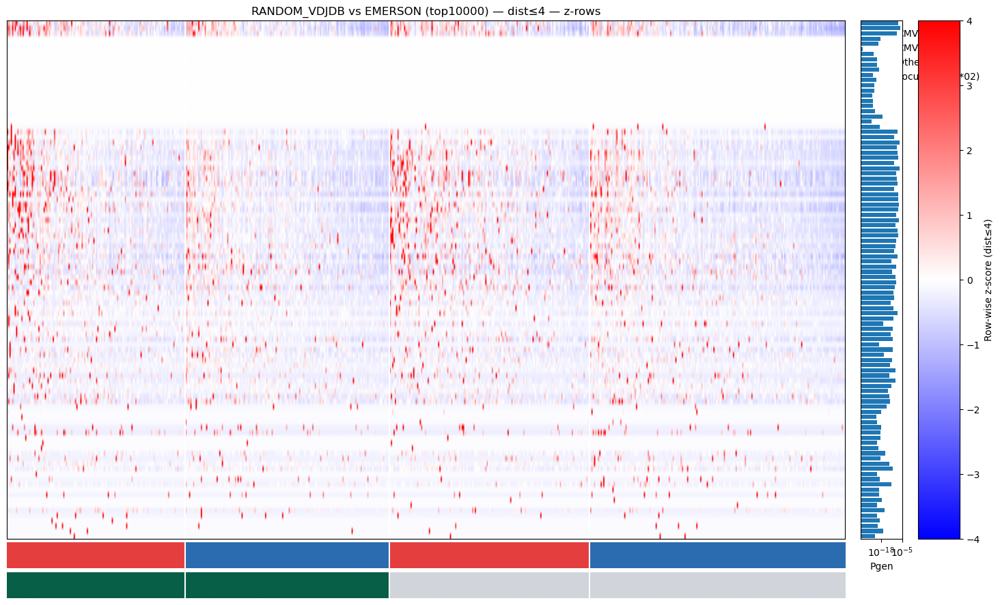

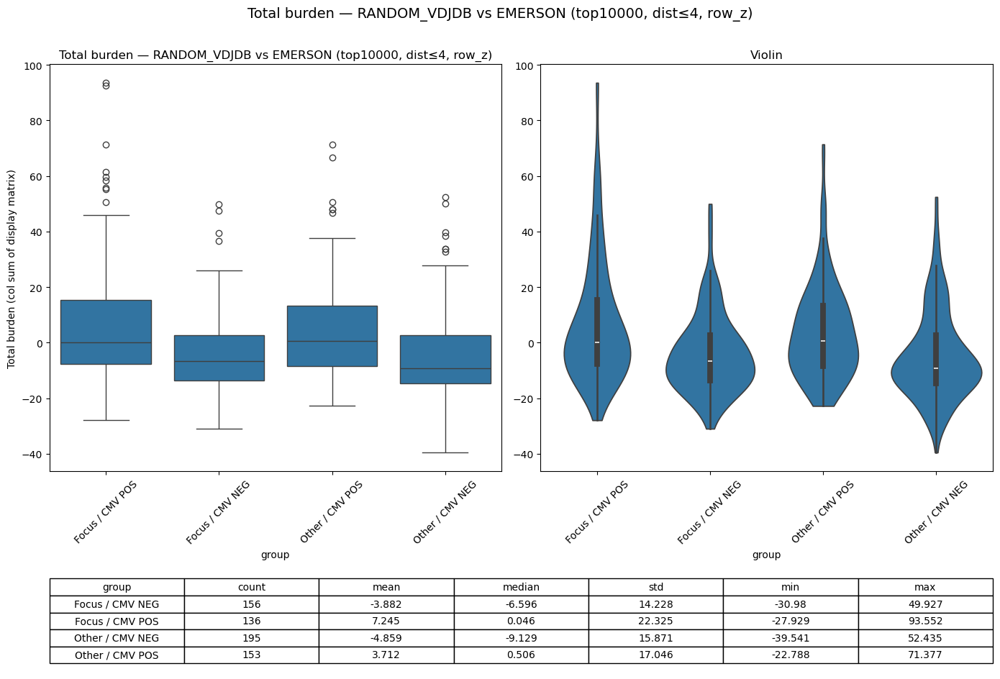

,highconf,rep,group,count,mean,median,std,min,max
0,invitro,emerson_top10000,Focus / CMV NEG,156,-9.227308,-15.156196,35.371995,-76.227471,161.632952
1,invitro,emerson_top10000,Focus / CMV POS,136,15.990744,7.138234,43.761041,-68.887006,165.632673
2,invitro,emerson_top10000,Other / CMV NEG,195,-11.884449,-17.302650,36.801803,-106.460471,108.698772
3,invitro,emerson_top10000,Other / CMV POS,153,10.341087,5.624536,38.021895,-62.436139,144.317437
4,vatcr,emerson_top10000,Focus / CMV NEG,156,-15.353168,-29.406433,88.088902,-143.602183,703.487210
5,vatcr,emerson_top10000,Focus / CMV POS,136,31.145262,-5.793137,130.078466,-151.997602,769.177521
6,vatcr,emerson_top10000,Other / CMV NEG,195,-19.042985,-36.911533,81.684175,-231.029489,303.148580
7,vatcr,emerson_top10000,Other / CMV POS,153,12.240003,-8.071779,92.691852,-135.919150,407.800193
8,ac02,emerson_top10000,Focus / CMV NEG,156,-11.951183,-21.656716,48.516844,-107.392514,216.210285
9,ac02,emerson_top10000,Focus / CMV POS,136,23.043841,10.961149,62.344403,-97.538131,239.311387


In [6]:
# ──────────────────────────────────────────────────────────────────────────────
# Unified Heatmap + Summary Pipeline (EMERSON / MAIR) — Jupyter paste-and-run
# ──────────────────────────────────────────────────────────────────────────────

import os, re, json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns

from matplotlib.colors import ListedColormap, TwoSlopeNorm
from matplotlib import gridspec
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

# Optional (only used for MAIR ROC)
try:
    from sklearn.metrics import roc_curve, auc
    _HAS_SKLEARN = True
except Exception:
    _HAS_SKLEARN = False

# ─────────────── CONFIG ───────────────
CONFIG = {
    # Cohort and inputs
    "cohort": "emerson",                    # "emerson" or "mair"
    "top_mode": "top10000",                 # "all" or "top10000"
    "highconf_list": ["invitro", "vatcr", "ac02", "random_olga", "random_vdjdb"],

    # Distance handling
    "max_dist": 4,                          # cumulative up to this distance (0..4 typical)

    # Normalisation
    "normalization": "row_z",               # "none" (raw sums) or "row_z" (z-score per sequence)

    # Plotting / saving
    "cap": 4,                               # for bwr clipped display if using row_z
    "save_figs": False,                     # set True to also save figures
    "out_dir": "/tmp/tcr_heatmaps",         # used only if save_figs=True
    "dpi": 150,

    # Shared paths
    "base_heat_dir": "/Users/ishaharris/Projects/TCR/TCR-Isha/data/heatmap_output",
    "pgen_dir": "/Users/ishaharris/Projects/TCR/TCR-Isha/data/pgen",

    # EMERSON metadata
    "emerson_metadata_file": "/Users/ishaharris/Projects/TCR/TCR-Isha/data/Repertoires/Cohort01_whole_metadata.tsv",
    "focus_alleles": ["A*02"],

    # MAIR metadata
    "mair_meta_file": "/Users/ishaharris/Projects/TCR/TCR-Isha/data/Repertoires/mair/mair_glioma_batch_1_metadata.tsv",
}

# ─────────────── General IO helpers ───────────────
def _safe_numeric(df: pd.DataFrame) -> pd.DataFrame:
    return df.apply(pd.to_numeric, errors="coerce").fillna(0.0)

def _try_load_single_or_stack(root_dir: str, max_dist: int) -> pd.DataFrame:
    """
    Try the single cumulative file pattern first:
        all_dist_{max_dist}_matrix.csv
    otherwise sum over:
        all_dist_{d}_matrix.csv for d=0..max_dist
    If those aren't present, also try legacy '{code}_dist_{d}_matrix.csv' where code='all'.
    Returns: rows=sequences, cols=patients (transposed from file where needed).
    """
    single = os.path.join(root_dir, f"all_dist_{max_dist}_matrix.csv")
    if os.path.exists(single):
        df = pd.read_csv(single, index_col="patient_id").T
        return _safe_numeric(df)

    # Stack all_dist_{d}
    parts = []
    for d in range(max_dist + 1):
        p = os.path.join(root_dir, f"all_dist_{d}_matrix.csv")
        if os.path.exists(p):
            df = pd.read_csv(p, index_col="patient_id").T
            parts.append(_safe_numeric(df))

    if parts:
        return sum(parts)

    # Legacy naming (e.g. "{code}_dist_{d}_matrix.csv")
    parts = []
    for d in range(max_dist + 1):
        p = os.path.join(root_dir, f"all_dist_{d}_matrix.csv")  # fallback already checked
        if os.path.exists(p):
            df = pd.read_csv(p, index_col="patient_id").T
            parts.append(_safe_numeric(df))
        else:
            p2 = os.path.join(root_dir, f"all_dist_{d}_matrix.csv")
            if os.path.exists(p2):
                df = pd.read_csv(p2, index_col="patient_id").T
                parts.append(_safe_numeric(df))

    if parts:
        return sum(parts)

    raise FileNotFoundError(f"No matrix files found in {root_dir} for 0..{max_dist} or all_dist_{max_dist}.")

def load_cumulative_matrix(root_dir: str, max_dist: int) -> pd.DataFrame:
    return _try_load_single_or_stack(root_dir, max_dist)

def maybe_make_outdir(save: bool, out_dir: str):
    if save and out_dir:
        os.makedirs(out_dir, exist_ok=True)

def save_or_show(fig, path: str | None, save: bool, dpi: int):
    if save and path:
        fig.savefig(path, dpi=dpi, bbox_inches="tight")
        plt.close(fig)
    else:
        plt.show()

# ─────────────── EMERSON: metadata maps (CMV/HLA) ───────────────
def build_emerson_maps(metadata_path: str, focus_alleles: list[str]):
    """
    Returns:
      cmv_map: { filename 'Pxxxxx.tsv' -> 0/1 }
      hla_map: { filename 'Pxxxxx.tsv' -> 0/1 }, 1 if any focus HLA present in tags
    """
    meta = pd.read_csv(metadata_path, sep="\t")
    filt = meta[
        meta["sample_name"].astype(str).str.startswith("P") &
        meta["sample_tags"].astype(str).str.contains(r"Cytomegalovirus\s+[+-]", case=False, na=False)
    ]
    if filt.empty:
        raise ValueError("No EMERSON metadata rows match CMV/sample_name filters.")

    cmv_map, hla_map = {}, {}
    for _, row in filt.iterrows():
        pid = str(row["sample_name"]) + ".tsv"
        tags = str(row["sample_tags"])
        if "Cytomegalovirus +" in tags:
            cmv_map[pid] = 1
        elif "Cytomegalovirus -" in tags:
            cmv_map[pid] = 0
        else:
            continue
        hla_map[pid] = int(any(f"HLA-{allele}" in tags for allele in focus_alleles))
    return cmv_map, hla_map

def load_pgen_map(pgen_dir: str, highconf: str) -> dict:
    """
    Optional: load Pgen per sequence for the Pgen sidebar.
    Expected TSV with columns: Sequence, Pgen
    """
    f = os.path.join(pgen_dir, f"all_{highconf}.tsv")
    if not os.path.exists(f):
        return {}
    df = pd.read_csv(f, sep="\t")
    if "Sequence" not in df.columns or "Pgen" not in df.columns:
        return {}
    return df.set_index("Sequence")["Pgen"].to_dict()

def emerson_order_columns(df: pd.DataFrame, cmv_map: dict, hla_map: dict):
    totals = df.sum(axis=0)
    order = totals.sort_values(ascending=False).index.tolist()
    focus_pos = [c for c in order if hla_map.get(c, 0) == 1 and cmv_map.get(c) == 1]
    focus_neg = [c for c in order if hla_map.get(c, 0) == 1 and cmv_map.get(c) == 0]
    other_pos = [c for c in order if hla_map.get(c, 0) == 0 and cmv_map.get(c) == 1]
    other_neg = [c for c in order if hla_map.get(c, 0) == 0 and cmv_map.get(c) == 0]
    ordered = focus_pos + focus_neg + other_pos + other_neg
    blocks = (len(focus_pos), len(focus_neg), len(other_pos), len(other_neg))
    return ordered, blocks

# ─────────────── MAIR: IDH mapping ───────────────
def load_idh_map_from_mair_meta(path: str) -> dict:
    meta = pd.read_csv(path, sep="\t")
    if not {"sampleID", "IDH"}.issubset(meta.columns):
        raise ValueError("MAIR metadata must contain 'sampleID' and 'IDH'.")

    def norm_idh(v):
        s = str(v).strip().lower()
        if s in {"mut", "m", "1", "mutant", "r132h", "r132c", "idhm", "idh-mut"}:
            return "mut"
        if s in {"wt", "w", "0", "wildtype", "idhw", "idh-wt", "na"}:
            return "wt"
        return None

    by_base = {}
    for _, r in meta.iterrows():
        sid = str(r["sampleID"]).strip()     # e.g. CUH-145-R1
        parts = sid.split("-")
        if len(parts) < 3: 
            continue
        base = "-".join(parts[:2])           # CUH-145
        rep  = parts[-1].upper()             # R1/R2/…
        idh  = norm_idh(r["IDH"])
        if idh is None:
            continue
        if base not in by_base:
            by_base[base] = {"R1": None, "R2": None}
        if rep in ("R1", "R2"):
            by_base[base][rep] = idh

    final = {}
    for base, reps in by_base.items():
        final[base] = reps["R1"] if reps["R1"] is not None else reps["R2"]
    return final

def idh_for_column(col_name: str, idh_map: dict):
    base = os.path.basename(str(col_name)).replace("collapsed_mair_", "").replace(".tsv", "")
    return idh_map.get(base)

def mair_order_columns(df: pd.DataFrame, idh_map: dict):
    totals = df.sum(axis=0)
    mut = [c for c in df.columns if idh_for_column(c, idh_map) == "mut"]
    wt  = [c for c in df.columns if idh_for_column(c, idh_map) == "wt"]
    na  = [c for c in df.columns if idh_for_column(c, idh_map) is None]
    def _sort(sub): 
        return list(totals.loc[sub].sort_values(ascending=False).index) if sub else []
    mut, wt, na = _sort(mut), _sort(wt), _sort(na)
    return mut + wt + na, (len(mut), len(wt), len(na))

# ─────────────── Normalisation / clustering ───────────────
def rowwise_z(df: pd.DataFrame) -> pd.DataFrame:
    if df.empty: 
        return df.copy()
    z = df.sub(df.mean(axis=1), axis=0).div(df.std(axis=1), axis=0).fillna(0.0)
    return z

def optional_cluster_rows(df: pd.DataFrame):
    """
    Optional row clustering to order sequences; if <2 rows, skip.
    Returns reordered df and the dendrogram leaf order.
    """
    if df.shape[0] < 2:
        return df, list(range(df.shape[0]))
    dist = pdist(df.values, metric="euclidean")
    Z = linkage(dist, method="average")
    leaves = dendrogram(Z, no_plot=True)["leaves"]
    return df.iloc[leaves, :], leaves

# ─────────────── Plotting helpers ───────────────
def plot_heatmap_emerson(df_disp: pd.DataFrame, cmv_map: dict, hla_map: dict,
                         pgen_map: dict, max_dist: int, highconf: str,
                         focus_alleles: list[str], blocks, title_suffix: str,
                         normalization: str, cap: float,
                         save=False, out_path=None, dpi=150):
    ordered_cols = df_disp.columns.tolist()
    cmv_strip = np.array([cmv_map.get(c, 0) for c in ordered_cols], dtype=int)
    hla_strip = np.array([hla_map.get(c, 0) for c in ordered_cols], dtype=int)
    pgens = [pgen_map.get(seq, np.nan) for seq in df_disp.index]

    fig = plt.figure(figsize=(18, 11))
    gs  = fig.add_gridspec(3, 3, height_ratios=[20, 1, 1],
                           width_ratios=[20, 1, 1], hspace=0.02, wspace=0.05)
    ax_hm = fig.add_subplot(gs[0, 0])
    ax_pg = fig.add_subplot(gs[0, 1], sharey=ax_hm)
    ax_cb = fig.add_subplot(gs[0, 2])
    ax_cmv= fig.add_subplot(gs[1, 0], sharex=ax_hm)
    ax_hla= fig.add_subplot(gs[2, 0], sharex=ax_hm)

    # Heatmap colormap: if row_z → red/blue diverging, else viridis
    if normalization == "row_z":
        df_display = df_disp.clip(-cap, cap)
        norm = TwoSlopeNorm(vmin=-cap, vcenter=0, vmax=cap)
        cmap = "bwr"
        cbar_label = f"Row-wise z-score (dist≤{max_dist})"
    else:
        df_display = df_disp
        norm = None
        cmap = "viridis"
        cbar_label = f"Burden (dist≤{max_dist})"

    im = ax_hm.imshow(df_display.values, aspect="auto", cmap=cmap, norm=norm)
    fig.colorbar(im, cax=ax_cb, label=cbar_label)
    ax_hm.set_title(f"{highconf.upper()} vs {title_suffix}")
    ax_hm.set_yticks([]); ax_hm.set_xticks([])

    # Pgen bar (log scale)
    ax_pg.barh(np.arange(len(pgens)), pgens, align="center")
    ax_pg.invert_yaxis()
    ax_pg.set_xlabel("Pgen"); ax_pg.set_xscale("log"); ax_pg.set_yticks([])

    # CMV/HLA strips
    cmap_cmv = ListedColormap(["#2b6cb0", "#e53e3e"])     # 0=CMV–, 1=CMV+
    cmap_hla = ListedColormap(["#d1d5db", "#065f46"])     # 0=Other, 1=Focus
    ax_cmv.imshow(cmv_strip[None, :], aspect="auto", cmap=cmap_cmv, vmin=0, vmax=1)
    ax_hla.imshow(hla_strip[None, :], aspect="auto", cmap=cmap_hla, vmin=0, vmax=1)
    for ax in (ax_cmv, ax_hla):
        ax.set_yticks([]); ax.set_xticks([]); ax.set_frame_on(False)

    # Block separators
    cuts = np.cumsum(list(blocks))
    for c in cuts[:-1]:
        for ax in (ax_hm, ax_cmv, ax_hla):
            ax.axvline(c - 0.5, color="white", lw=1.5)

    # Legend
    leg = [
        mpatches.Patch(color=cmap_cmv(0), label="CMV–"),
        mpatches.Patch(color=cmap_cmv(1), label="CMV+"),
        mpatches.Patch(color=cmap_hla(0), label="Other HLA"),
        mpatches.Patch(color=cmap_hla(1), label=f"Focus HLA ({', '.join(CONFIG['focus_alleles'])})"),
    ]
    ax_hm.legend(handles=leg, loc="upper left", bbox_to_anchor=(1.02, 1.0), frameon=False)

    save_or_show(fig, out_path, save, dpi)


def plot_heatmap_mair(df_norm: pd.DataFrame, idh_map: dict, blocks, max_dist: int,
                      highconf: str, cap: float, title_suffix: str,
                      save=False, out_path=None, dpi=150):
    # Display with bwr clipped at ±cap if normalized; else viridis
    if CONFIG["normalization"] == "row_z":
        df_disp = df_norm.clip(-cap, cap)
        norm = TwoSlopeNorm(vmin=-cap, vcenter=0, vmax=cap)
        cmap = "bwr"
        cbar_label = f"Normalized burden (z, dist≤{max_dist})"
    else:
        df_disp = df_norm
        norm = None
        cmap = "viridis"
        cbar_label = f"Burden (dist≤{max_dist})"

    idh_enc = {"wt": 1, "mut": 2}
    strip = np.array([idh_enc.get(idh_for_column(c, idh_map), 0) for c in df_norm.columns], dtype=int)

    fig = plt.figure(figsize=(18, 11))
    gs  = fig.add_gridspec(2, 3, height_ratios=[20, 1], width_ratios=[20, 1, 1], hspace=0.02, wspace=0.05)
    ax_hm = fig.add_subplot(gs[0, 0])
    ax_pg = fig.add_subplot(gs[0, 1], sharey=ax_hm)  # placeholder to keep layout parity
    ax_cb = fig.add_subplot(gs[0, 2])
    ax_idh= fig.add_subplot(gs[1, 0], sharex=ax_hm)

    im = ax_hm.imshow(df_disp.values, aspect="auto", cmap=cmap, norm=norm)
    fig.colorbar(im, cax=ax_cb, label=cbar_label)
    ax_hm.set_title(f"{highconf.upper()} vs {title_suffix}")
    ax_hm.set_yticks([]); ax_hm.set_xticks([])

    ax_pg.barh(np.arange(df_norm.shape[0]), np.ones(df_norm.shape[0]))
    ax_pg.invert_yaxis(); ax_pg.set_xlabel("Pgen"); ax_pg.set_yticks([])

    cmap_idh = ListedColormap(["#d1d5db", "#2563eb", "#dc2626"])  # Unknown, WT, MUT
    ax_idh.imshow(strip[None, :], aspect="auto", cmap=cmap_idh, vmin=0, vmax=2)
    ax_idh.set_yticks([]); ax_idh.set_xticks([]); ax_idh.set_frame_on(False)

    cuts = np.cumsum(list(blocks))
    for c in cuts[:-1]:
        for ax in (ax_hm, ax_idh):
            ax.axvline(c - 0.5, color="white", lw=1.5)

    leg = [
        mpatches.Patch(color=cmap_idh(2/2), label="IDH MUT"),
        mpatches.Patch(color=cmap_idh(1/2), label="IDH WT"),
        mpatches.Patch(color=cmap_idh(0/2), label="Unknown"),
    ]
    ax_hm.legend(handles=leg, loc="upper left", bbox_to_anchor=(1.02, 1.0), frameon=False)

    save_or_show(fig, out_path, save, dpi)

def summary_panel_by_groups(values: pd.Series, group_labels: pd.Series,
                            title: str, ylab: str,
                            save=False, out_path=None, dpi=150):
    df = pd.DataFrame({"value": values.values, "group": group_labels.values})
    order = [g for g in ["Focus / CMV POS","Focus / CMV NEG","Other / CMV POS","Other / CMV NEG",
                         "IDH MUT","IDH WT","Unknown"] if g in set(df["group"])]

    stats = df.groupby("group", observed=True)["value"].agg(
        count="count", mean="mean", median="median", std="std", min="min", max="max"
    ).reset_index()
    stats_display = stats.copy()
    if not stats_display.empty:
        stats_display.iloc[:, 1:] = stats_display.iloc[:, 1:].round(3)

    vals = df["value"].to_numpy()
    if vals.size:
        y_lo = vals.min() - 0.05 * (vals.max() - vals.min())
        y_hi = vals.max() + 0.05 * (vals.max() - vals.min())
    else:
        y_lo, y_hi = (0, 1)

    fig = plt.figure(figsize=(14, 10))
    gs = gridspec.GridSpec(2, 2, height_ratios=[4, 1])
    ax_bx = fig.add_subplot(gs[0, 0])
    ax_vl = fig.add_subplot(gs[0, 1], sharey=ax_bx)
    ax_tb = fig.add_subplot(gs[1, :])

    sns.boxplot(data=df, x="group", y="value", order=order, ax=ax_bx)
    ax_bx.set_ylim(y_lo, y_hi); ax_bx.set_title(title); ax_bx.set_ylabel(ylab)
    ax_bx.tick_params(axis="x", rotation=45)

    sns.violinplot(data=df, x="group", y="value", order=order, cut=0, inner="box", ax=ax_vl)
    ax_vl.set_ylim(y_lo, y_hi); ax_vl.set_title("Violin"); ax_vl.tick_params(axis="x", rotation=45)
    ax_vl.set_ylabel("")

    ax_tb.axis("off")
    table = ax_tb.table(cellText=stats_display.values if not stats_display.empty else [[""]*7],
                        colLabels=stats_display.columns if not stats_display.empty else ["group","count","mean","median","std","min","max"],
                        cellLoc="center", loc="center")
    table.auto_set_font_size(False); table.set_fontsize(10); table.scale(1, 1.4)

    plt.suptitle(title, fontsize=14, y=0.94)
    plt.tight_layout(rect=[0, 0, 1, 0.93])
    save_or_show(fig, out_path, save, dpi)
    return stats

def mair_idh_roc(df_norm: pd.DataFrame, idh_map: dict, title_suffix: str,
                 save=False, out_path=None, dpi=150):
    if not _HAS_SKLEARN:
        print("[INFO] sklearn not available — skipping ROC.")
        return None
    if df_norm.empty:
        print("[INFO] No data for ROC.")
        return None

    mean_score = df_norm.mean(axis=0)
    labels, scores = [], []
    for col, s in mean_score.items():
        lab = idh_for_column(col, idh_map)
        if lab == "mut":
            labels.append(1); scores.append(float(s))
        elif lab == "wt":
            labels.append(0); scores.append(float(s))
    if len(set(labels)) < 2:
        print("[INFO] Need both WT and MUT — skipping ROC.")
        return None

    fpr, tpr, _ = roc_curve(np.array(labels, int), np.array(scores, float))
    roc_auc = auc(fpr, tpr)

    fig = plt.figure(figsize=(6, 6))
    plt.plot(fpr, tpr, lw=2, label=f"AUC = {roc_auc:.3f}")
    plt.plot([0, 1], [0, 1], lw=1, linestyle="--")
    plt.xlim([0, 1]); plt.ylim([0, 1.05])
    plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
    plt.title(f"ROC for IDH Mutation (mean normalised burden)\n{title_suffix}")
    plt.legend(loc="lower right")
    plt.tight_layout()
    save_or_show(fig, out_path, save, dpi)
    return roc_auc

def emerson_cmv_roc(df_disp: pd.DataFrame, cmv_map: dict, normalization: str, title_suffix: str,
                    save=False, out_path=None, dpi=150):
    """
    ROC to predict CMV status (0=CMV–, 1=CMV+) from per-patient scores.
    If normalization == 'row_z':   score = mean of row-wise z across sequences (columns).
    Else (raw):                    score = z-scored total burden across patients.

    Works across BOTH focus and non-focus HLA columns (no HLA filtering).
    """
    if not _HAS_SKLEARN:
        print("[INFO] sklearn not available — skipping EMERSON CMV ROC.")
        return None
    if df_disp.empty:
        print("[INFO] No data for EMERSON CMV ROC.")
        return None

    if normalization == "row_z":
        # Already row-wise z; take per-patient mean as a compact score
        scores_series = df_disp.mean(axis=0)
    else:
        # Raw: use total burden then z-score across patients to make it comparable
        totals = df_disp.sum(axis=0)
        if totals.std(ddof=0) == 0:
            scores_series = totals - totals.mean()
        else:
            scores_series = (totals - totals.mean()) / totals.std(ddof=0)

    # Build labels and aligned scores for patients with known CMV status
    labels, scores = [], []
    for pid, sc in scores_series.items():
        if pid in cmv_map:            # 1 = CMV+, 0 = CMV–
            labels.append(int(cmv_map[pid]))
            scores.append(float(sc))

    if len(set(labels)) < 2:
        print("[INFO] Need both CMV+ and CMV– to compute ROC — skipping.")
        return None

    from sklearn.metrics import roc_curve, auc
    fpr, tpr, _ = roc_curve(np.array(labels, dtype=int), np.array(scores, dtype=float))
    roc_auc = auc(fpr, tpr)

    fig = plt.figure(figsize=(6, 6))
    plt.plot(fpr, tpr, lw=2, label=f"AUC = {roc_auc:.3f}")
    plt.plot([0, 1], [0, 1], lw=1, linestyle="--")
    plt.xlim([0, 1]); plt.ylim([0, 1.05])
    plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
    plt.title(f"ROC for CMV status — {title_suffix}")
    plt.legend(loc="lower right")
    plt.tight_layout()
    save_or_show(fig, out_path, save, dpi)
    return roc_auc


# ─────────────── MAIN ───────────────
cohort = CONFIG["cohort"].lower()                # "emerson" | "mair"
rep_suffix = f"{cohort}" + ("" if CONFIG["top_mode"] == "all" else f"_{CONFIG['top_mode']}")
max_dist = CONFIG["max_dist"]
maybe_make_outdir(CONFIG["save_figs"], CONFIG["out_dir"])

# Metadata init
cmv_map_all = hla_map_all = None
idh_map_all = None
if cohort == "emerson":
    cmv_map_all, hla_map_all = build_emerson_maps(CONFIG["emerson_metadata_file"], CONFIG["focus_alleles"])
elif cohort == "mair":
    idh_map_all = load_idh_map_from_mair_meta(CONFIG["mair_meta_file"])

all_stats = []   # accumulate per-(highconf, cohort/top_mode) summary stats

for highconf in CONFIG["highconf_list"]:
    root_dir = os.path.join(CONFIG["base_heat_dir"], f"{highconf}_{rep_suffix}")
    if not os.path.isdir(root_dir):
        print(f"[WARN] Missing folder: {root_dir} — skipping {highconf}.")
        continue

    print(f"\n=== {highconf.upper()} ({rep_suffix}) ===")
    try:
        df_raw = load_cumulative_matrix(root_dir, max_dist)  # rows=seqs, cols=patients
    except FileNotFoundError as e:
        print(f"[WARN] {e} — skipping.")
        continue

    if cohort == "emerson":
        # keep only patients present in metadata
        keep = [c for c in df_raw.columns if c in cmv_map_all]
        df_raw = df_raw[keep]
        if df_raw.empty:
            print("[WARN] No EMERSON columns after metadata filter.")
            continue

    # Normalisation
    if CONFIG["normalization"] == "row_z":
        df_norm = rowwise_z(df_raw)
    else:
        df_norm = df_raw.copy()

    # Optional clustering of rows to tidy visuals
    df_norm, _ = optional_cluster_rows(df_norm)

    # Column ordering & plotting
    if cohort == "emerson":
        ordered_cols, blocks = emerson_order_columns(df_norm, cmv_map_all, hla_map_all)
        df_norm = df_norm[ordered_cols]

        # Heatmap
        pgen_map = load_pgen_map(CONFIG["pgen_dir"], highconf)
        title_suffix = f"EMERSON ({CONFIG['top_mode']}) — dist≤{max_dist} — {'z-rows' if CONFIG['normalization']=='row_z' else 'raw'}"
        out_hm = os.path.join(CONFIG["out_dir"], f"hm_{cohort}_{CONFIG['top_mode']}_{highconf}.png") if CONFIG["save_figs"] else None

        plot_heatmap_emerson(
            df_norm,
            cmv_map_all, hla_map_all, pgen_map,
            max_dist, highconf,
            CONFIG["focus_alleles"], blocks, title_suffix,
            CONFIG["normalization"], CONFIG["cap"],            # ← new required args
            save=CONFIG["save_figs"], out_path=out_hm, dpi=CONFIG["dpi"])

        # Summary stats: total burden per patient (use displayed data basis)
        totals = df_norm.sum(axis=0)
        # Group labels
        def grp(pid):
            return ("Focus / CMV POS" if hla_map_all.get(pid,0)==1 and cmv_map_all.get(pid)==1 else
                    "Focus / CMV NEG" if hla_map_all.get(pid,0)==1 and cmv_map_all.get(pid)==0 else
                    "Other / CMV POS" if hla_map_all.get(pid,0)==0 and cmv_map_all.get(pid)==1 else
                    "Other / CMV NEG")
        groups = totals.index.to_series().map(grp)

        out_sp = os.path.join(CONFIG["out_dir"], f"summary_{cohort}_{CONFIG['top_mode']}_{highconf}.png") if CONFIG["save_figs"] else None
        stats = summary_panel_by_groups(
            totals, groups,
            title=f"Total burden — {highconf.upper()} vs EMERSON ({CONFIG['top_mode']}, dist≤{max_dist}, {CONFIG['normalization']})",
            ylab="Total burden (col sum of display matrix)",
            save=CONFIG["save_figs"], out_path=out_sp, dpi=CONFIG["dpi"]
        )
        stats.insert(0, "highconf", highconf)
        stats.insert(1, "rep", rep_suffix)
        all_stats.append(stats)


        

    else:  # MAIR
        ordered_cols, blocks = mair_order_columns(df_norm, idh_map_all)
        df_norm = df_norm[ordered_cols]

        title_suffix = f"MAIR ({CONFIG['top_mode']}) — {'z-rows' if CONFIG['normalization']=='row_z' else 'raw'}"
        out_hm = os.path.join(CONFIG["out_dir"], f"hm_{cohort}_{CONFIG['top_mode']}_{highconf}.png") if CONFIG["save_figs"] else None
        plot_heatmap_mair(
            df_norm, idh_map_all, blocks, max_dist, highconf, CONFIG["cap"], title_suffix,
            save=CONFIG["save_figs"], out_path=out_hm, dpi=CONFIG["dpi"]
        )

        # Summary stats: per-patient totals of the display matrix (z or raw)
        totals = df_norm.sum(axis=0)
        def grp(col):
            lab = idh_for_column(col, idh_map_all)
            return "IDH MUT" if lab == "mut" else ("IDH WT" if lab == "wt" else "Unknown")
        groups = totals.index.to_series().map(grp)

        out_sp = os.path.join(CONFIG["out_dir"], f"summary_{cohort}_{CONFIG['top_mode']}_{highconf}.png") if CONFIG["save_figs"] else None
        ylab = "Normalized burden (sum of z across seqs)" if CONFIG["normalization"]=="row_z" else "Total burden (raw sum)"
        stats = summary_panel_by_groups(
            totals, groups,
            title=f"Burden — {highconf.upper()} vs MAIR ({CONFIG['top_mode']}, dist≤{max_dist}, {CONFIG['normalization']})",
            ylab=ylab,
            save=CONFIG["save_figs"], out_path=out_sp, dpi=CONFIG["dpi"]
        )
        stats.insert(0, "highconf", highconf)
        stats.insert(1, "rep", rep_suffix)
        all_stats.append(stats)

                # ── EMERSON CMV ROC (predict CMV across ALL columns: focus + non-focus HLA)
        out_roc = os.path.join(
            CONFIG["out_dir"], f"roc_emerson_{CONFIG['top_mode']}_{highconf}.png"
        ) if CONFIG["save_figs"] else None

        emerson_cmv_roc(
            df_norm,                      # uses the displayed matrix (row_z or raw)
            cmv_map_all,
            CONFIG["normalization"],
            title_suffix=f"{highconf.upper()} (EMERSON, dist≤{max_dist}, {CONFIG['normalization']})",
            save=CONFIG["save_figs"], out_path=out_roc, dpi=CONFIG["dpi"]
        )


        # ROC (MAIR only; only meaningful if using normalization)
        if CONFIG["normalization"] == "row_z":
            out_roc = os.path.join(CONFIG["out_dir"], f"roc_{cohort}_{CONFIG['top_mode']}_{highconf}.png") if CONFIG["save_figs"] else None
            mair_idh_roc(df_norm, idh_map_all, title_suffix=f"{highconf.upper()} (dist≤{max_dist})",
                         save=CONFIG["save_figs"], out_path=out_roc, dpi=CONFIG["dpi"])

# Consolidated stats across all highconf for this run
if all_stats:
    stats_all = pd.concat(all_stats, ignore_index=True)
    display(stats_all)
else:
    print("[INFO] No stats collected.")



=== INVITRO (emerson_top10000) ===


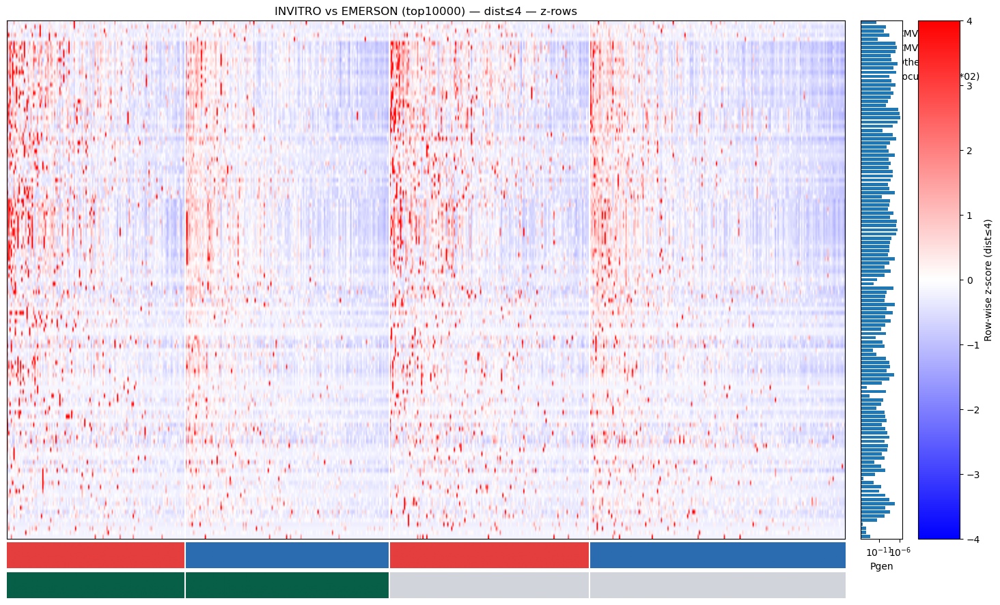

/var/folders/ls/vwbn46k51_dbtpbp9vjn8kzh0000gq/T/ipykernel_4578/1563990349.py:453: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.95])


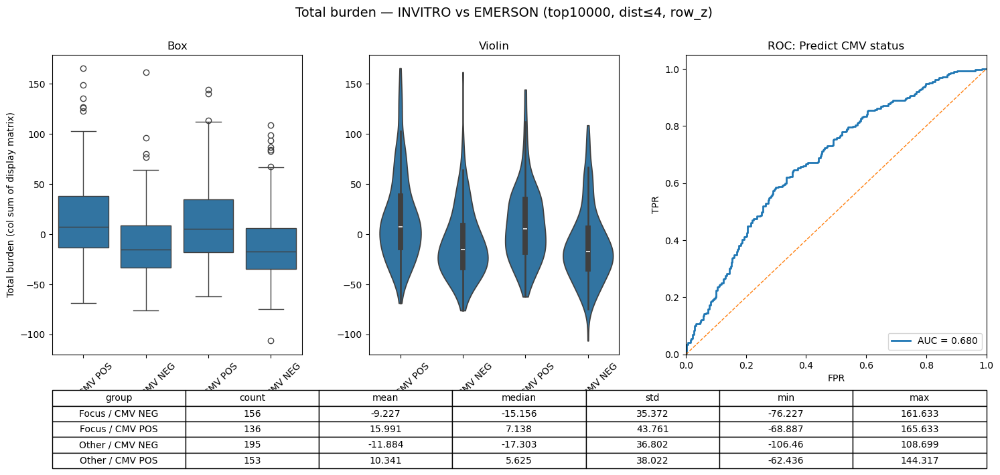


=== VATCR (emerson_top10000) ===


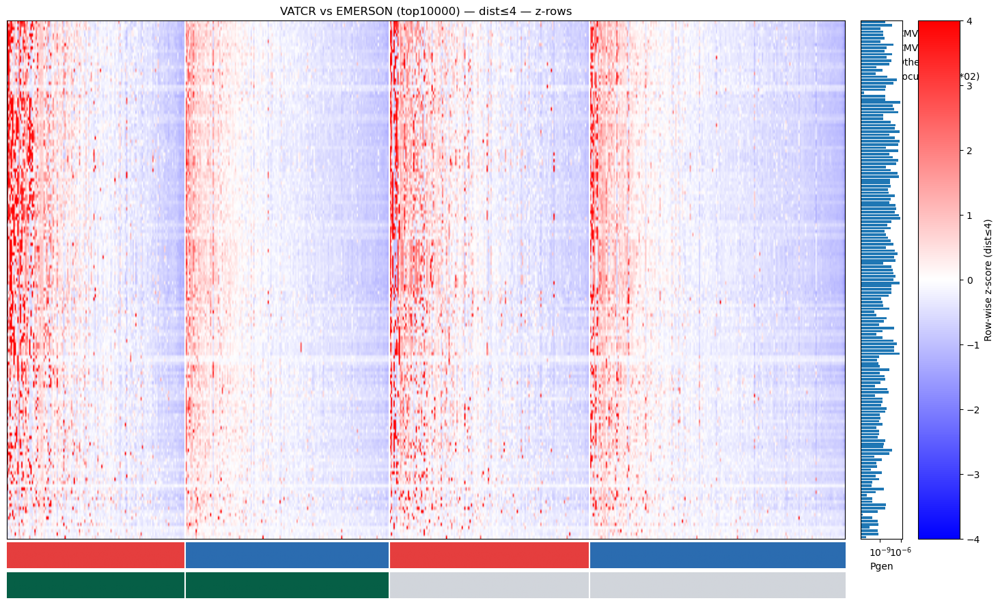

/var/folders/ls/vwbn46k51_dbtpbp9vjn8kzh0000gq/T/ipykernel_4578/1563990349.py:453: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.95])


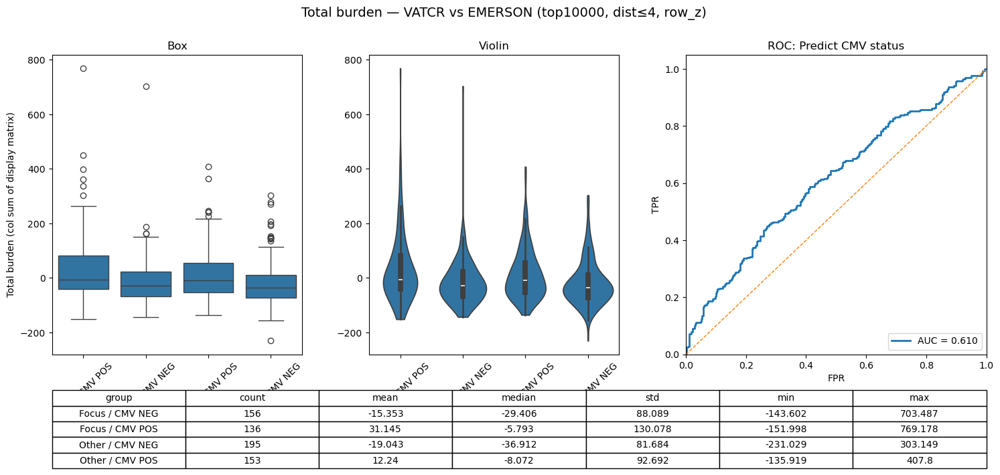


=== AC02 (emerson_top10000) ===


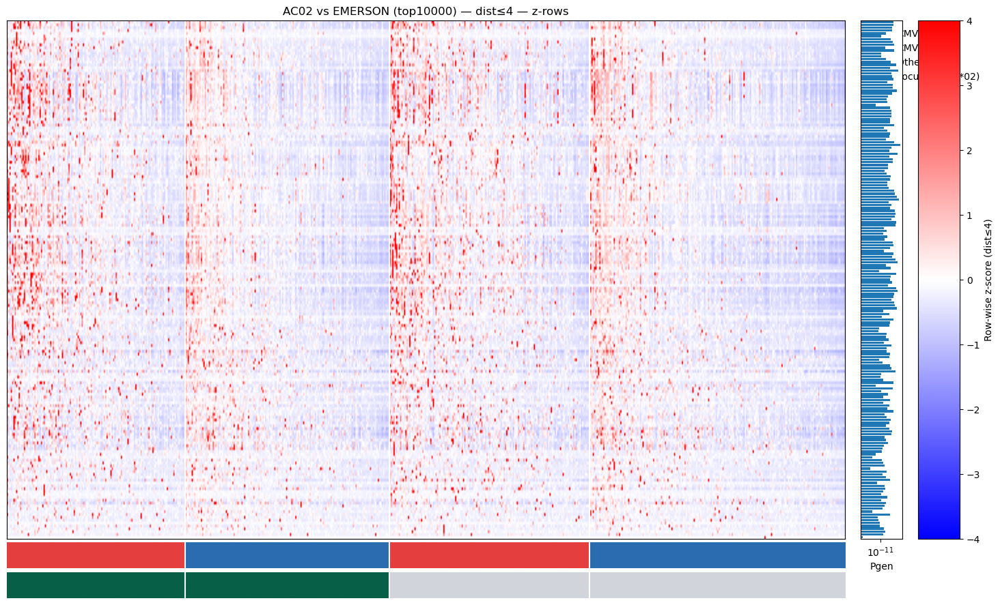

/var/folders/ls/vwbn46k51_dbtpbp9vjn8kzh0000gq/T/ipykernel_4578/1563990349.py:453: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.95])


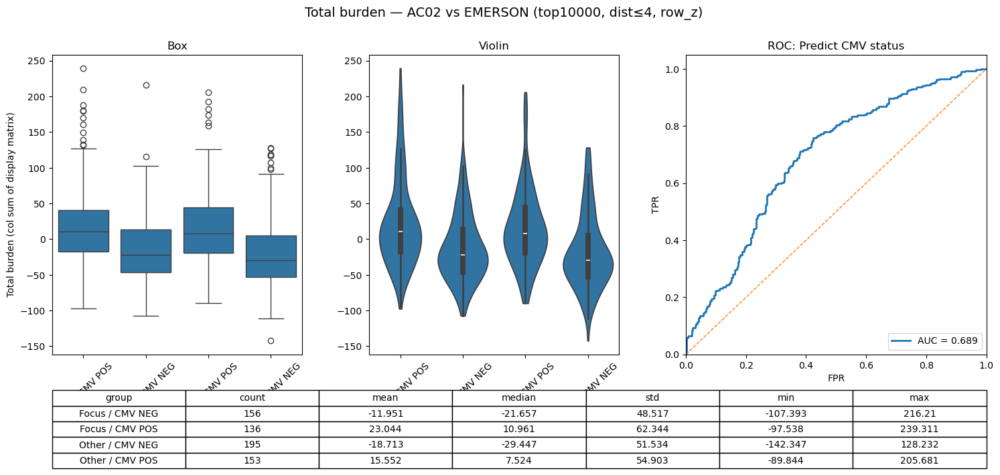


=== RANDOM_OLGA (emerson_top10000) ===


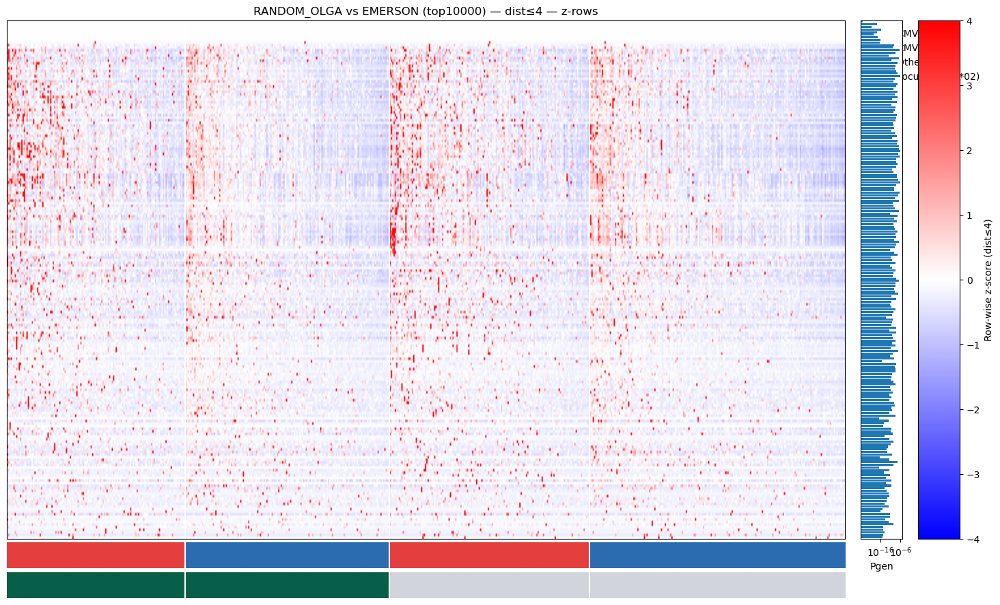

/var/folders/ls/vwbn46k51_dbtpbp9vjn8kzh0000gq/T/ipykernel_4578/1563990349.py:453: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.95])


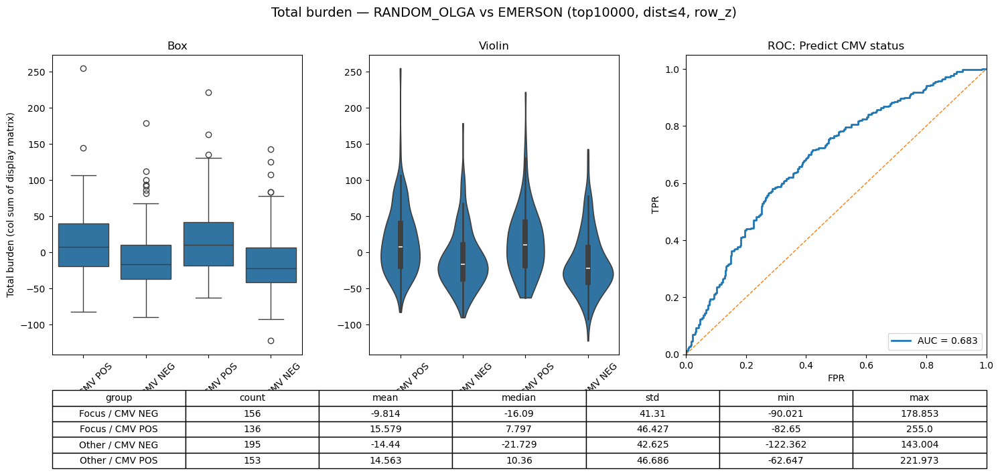


=== RANDOM_VDJDB (emerson_top10000) ===


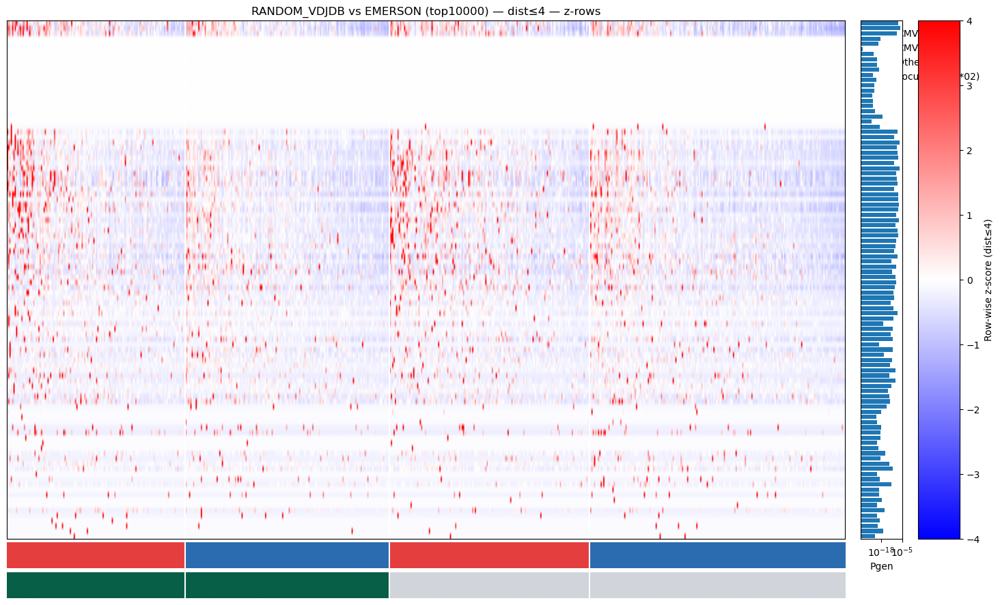

/var/folders/ls/vwbn46k51_dbtpbp9vjn8kzh0000gq/T/ipykernel_4578/1563990349.py:453: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.95])


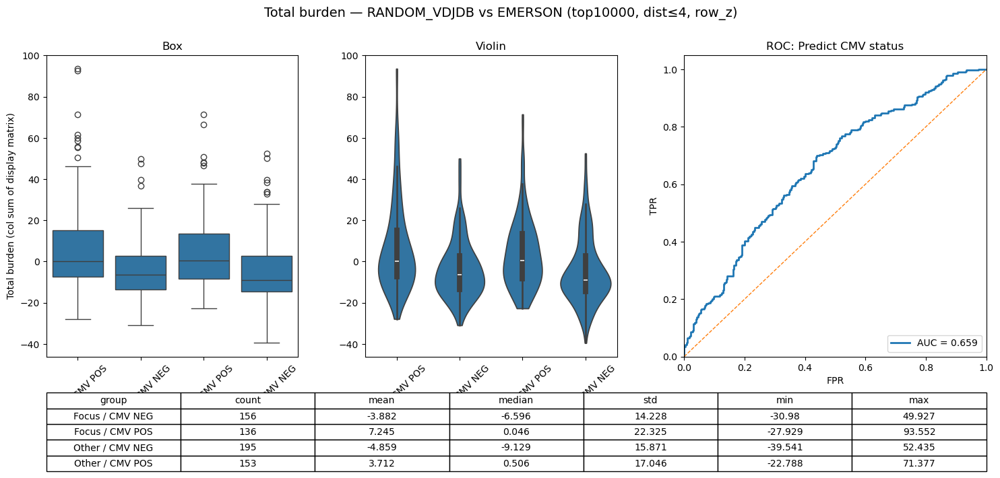

,highconf,rep,group,count,mean,median,std,min,max,metric,value
0,invitro,emerson_top10000,Focus / CMV NEG,156.0,-9.227308,-15.156196,35.371995,-76.227471,161.632952,NaN,NaN
1,invitro,emerson_top10000,Focus / CMV POS,136.0,15.990744,7.138234,43.761041,-68.887006,165.632673,NaN,NaN
2,invitro,emerson_top10000,Other / CMV NEG,195.0,-11.884449,-17.302650,36.801803,-106.460471,108.698772,NaN,NaN
3,invitro,emerson_top10000,Other / CMV POS,153.0,10.341087,5.624536,38.021895,-62.436139,144.317437,NaN,NaN
4,invitro,emerson_top10000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CMV_ROC_AUC,0.679699
5,vatcr,emerson_top10000,Focus / CMV NEG,156.0,-15.353168,-29.406433,88.088902,-143.602183,703.487210,NaN,NaN
6,vatcr,emerson_top10000,Focus / CMV POS,136.0,31.145262,-5.793137,130.078466,-151.997602,769.177521,NaN,NaN
7,vatcr,emerson_top10000,Other / CMV NEG,195.0,-19.042985,-36.911533,81.684175,-231.029489,303.148580,NaN,NaN
8,vatcr,emerson_top10000,Other / CMV POS,153.0,12.240003,-8.071779,92.691852,-135.919150,407.800193,NaN,NaN
9,vatcr,emerson_top10000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,CMV_ROC_AUC,0.609667


In [8]:
# ──────────────────────────────────────────────────────────────────────────────
# Unified Heatmap + Summary (with embedded ROC) — EMERSON (CMV) / MAIR (IDH)
# Paste-and-run in Jupyter
# ──────────────────────────────────────────────────────────────────────────────

import os, re, json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns

from matplotlib.colors import ListedColormap, TwoSlopeNorm
from matplotlib import gridspec
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram

# sklearn is optional; ROC depends on it
try:
    from sklearn.metrics import roc_curve, auc
    _HAS_SKLEARN = True
except Exception:
    _HAS_SKLEARN = False

try:
    from IPython.display import display
except Exception:
    pass

# ─────────────── CONFIG ───────────────
CONFIG = {
    # Cohort and inputs
    "cohort": "emerson",                    # "emerson" or "mair"
    "top_mode": "top10000",                 # "all" or "top10000"
    "highconf_list": ["invitro", "vatcr", "ac02", "random_olga", "random_vdjdb"],

    # Distance handling
    "max_dist": 4,                          # cumulative up to this distance (0..4 typical)

    # Normalisation
    "normalization": "row_z",               # "none" (raw sums) or "row_z" (z-score per sequence/row)

    # Plotting / saving
    "cap": 4,                               # for bwr clipped display if using row_z
    "save_figs": False,                     # set True to also save figures
    "out_dir": "/tmp/tcr_heatmaps",         # used only if save_figs=True
    "dpi": 150,

    # Shared paths
    "base_heat_dir": "/Users/ishaharris/Projects/TCR/TCR-Isha/data/heatmap_output",
    "pgen_dir": "/Users/ishaharris/Projects/TCR/TCR-Isha/data/pgen",

    # EMERSON metadata
    "emerson_metadata_file": "/Users/ishaharris/Projects/TCR/TCR-Isha/data/Repertoires/Cohort01_whole_metadata.tsv",
    "focus_alleles": ["A*02"],

    # MAIR metadata
    "mair_meta_file": "/Users/ishaharris/Projects/TCR/TCR-Isha/data/Repertoires/mair/mair_glioma_batch_1_metadata.tsv",
}

# ─────────────── General IO helpers ───────────────
def _safe_numeric(df: pd.DataFrame) -> pd.DataFrame:
    return df.apply(pd.to_numeric, errors="coerce").fillna(0.0)

def _try_load_single_or_stack(root_dir: str, max_dist: int) -> pd.DataFrame:
    """
    Try single cumulative file:
        all_dist_{max_dist}_matrix.csv
    else sum:
        all_dist_{d}_matrix.csv for d=0..max_dist
    Returns rows=sequences, cols=patients (transpose from patient_id index).
    """
    single = os.path.join(root_dir, f"all_dist_{max_dist}_matrix.csv")
    if os.path.exists(single):
        df = pd.read_csv(single, index_col="patient_id").T
        return _safe_numeric(df)

    parts = []
    for d in range(max_dist + 1):
        p = os.path.join(root_dir, f"all_dist_{d}_matrix.csv")
        if os.path.exists(p):
            df = pd.read_csv(p, index_col="patient_id").T
            parts.append(_safe_numeric(df))

    if parts:
        return sum(parts)

    raise FileNotFoundError(f"No matrix files found in {root_dir} for 0..{max_dist} or all_dist_{max_dist}.")

def load_cumulative_matrix(root_dir: str, max_dist: int) -> pd.DataFrame:
    return _try_load_single_or_stack(root_dir, max_dist)

def maybe_make_outdir(save: bool, out_dir: str):
    if save and out_dir:
        os.makedirs(out_dir, exist_ok=True)

def save_or_show(fig, path: str | None, save: bool, dpi: int):
    if save and path:
        fig.savefig(path, dpi=dpi, bbox_inches="tight")
        plt.close(fig)
    else:
        plt.show()

# ─────────────── EMERSON: metadata maps (CMV/HLA) ───────────────
def build_emerson_maps(metadata_path: str, focus_alleles: list[str]):
    """
    Returns:
      cmv_map: { filename 'Pxxxxx.tsv' -> 0/1 }
      hla_map: { filename 'Pxxxxx.tsv' -> 0/1 }, 1 if any focus HLA present in tags
    """
    meta = pd.read_csv(metadata_path, sep="\t")
    filt = meta[
        meta["sample_name"].astype(str).str.startswith("P") &
        meta["sample_tags"].astype(str).str.contains(r"Cytomegalovirus\s+[+-]", case=False, na=False)
    ]
    if filt.empty:
        raise ValueError("No EMERSON metadata rows match CMV/sample_name filters.")

    cmv_map, hla_map = {}, {}
    for _, row in filt.iterrows():
        pid = str(row["sample_name"]) + ".tsv"
        tags = str(row["sample_tags"])
        if "Cytomegalovirus +" in tags:
            cmv_map[pid] = 1
        elif "Cytomegalovirus -" in tags:
            cmv_map[pid] = 0
        else:
            continue
        hla_map[pid] = int(any(f"HLA-{allele}" in tags for allele in focus_alleles))
    return cmv_map, hla_map

def load_pgen_map(pgen_dir: str, highconf: str) -> dict:
    """
    Optional: load Pgen per sequence for the Pgen sidebar.
    Expected TSV with columns: Sequence, Pgen
    """
    f = os.path.join(pgen_dir, f"all_{highconf}.tsv")
    if not os.path.exists(f):
        return {}
    df = pd.read_csv(f, sep="\t")
    if "Sequence" not in df.columns or "Pgen" not in df.columns:
        return {}
    return df.set_index("Sequence")["Pgen"].to_dict()

def emerson_order_columns(df: pd.DataFrame, cmv_map: dict, hla_map: dict):
    totals = df.sum(axis=0)
    order = totals.sort_values(ascending=False).index.tolist()
    focus_pos = [c for c in order if hla_map.get(c, 0) == 1 and cmv_map.get(c) == 1]
    focus_neg = [c for c in order if hla_map.get(c, 0) == 1 and cmv_map.get(c) == 0]
    other_pos = [c for c in order if hla_map.get(c, 0) == 0 and cmv_map.get(c) == 1]
    other_neg = [c for c in order if hla_map.get(c, 0) == 0 and cmv_map.get(c) == 0]
    ordered = focus_pos + focus_neg + other_pos + other_neg
    blocks = (len(focus_pos), len(focus_neg), len(other_pos), len(other_neg))
    return ordered, blocks

# ─────────────── MAIR: IDH mapping ───────────────
def load_idh_map_from_mair_meta(path: str) -> dict:
    meta = pd.read_csv(path, sep="\t")
    if not {"sampleID", "IDH"}.issubset(meta.columns):
        raise ValueError("MAIR metadata must contain 'sampleID' and 'IDH'.")

    def norm_idh(v):
        s = str(v).strip().lower()
        if s in {"mut", "m", "1", "mutant", "r132h", "r132c", "idhm", "idh-mut"}:
            return "mut"
        if s in {"wt", "w", "0", "wildtype", "idhw", "idh-wt", "na"}:
            return "wt"
        return None

    by_base = {}
    for _, r in meta.iterrows():
        sid = str(r["sampleID"]).strip()     # e.g. CUH-145-R1
        parts = sid.split("-")
        if len(parts) < 3:
            continue
        base = "-".join(parts[:2])           # CUH-145
        rep  = parts[-1].upper()             # R1/R2/…
        idh  = norm_idh(r["IDH"])
        if idh is None:
            continue
        if base not in by_base:
            by_base[base] = {"R1": None, "R2": None}
        if rep in ("R1", "R2"):
            by_base[base][rep] = idh

    final = {}
    for base, reps in by_base.items():
        final[base] = reps["R1"] if reps["R1"] is not None else reps["R2"]
    return final

def idh_for_column(col_name: str, idh_map: dict):
    base = os.path.basename(str(col_name)).replace("collapsed_mair_", "").replace(".tsv", "")
    return idh_map.get(base)

def mair_order_columns(df: pd.DataFrame, idh_map: dict):
    totals = df.sum(axis=0)
    mut = [c for c in df.columns if idh_for_column(c, idh_map) == "mut"]
    wt  = [c for c in df.columns if idh_for_column(c, idh_map) == "wt"]
    na  = [c for c in df.columns if idh_for_column(c, idh_map) is None]
    def _sort(sub):
        return list(totals.loc[sub].sort_values(ascending=False).index) if sub else []
    mut, wt, na = _sort(mut), _sort(wt), _sort(na)
    return mut + wt + na, (len(mut), len(wt), len(na))

# ─────────────── Normalisation / clustering ───────────────
def rowwise_z(df: pd.DataFrame) -> pd.DataFrame:
    if df.empty:
        return df.copy()
    z = df.sub(df.mean(axis=1), axis=0).div(df.std(axis=1), axis=0).fillna(0.0)
    return z

def optional_cluster_rows(df: pd.DataFrame):
    """
    Optional row clustering to order sequences; if <2 rows, skip.
    Returns reordered df and the dendrogram leaf order.
    """
    if df.shape[0] < 2:
        return df, list(range(df.shape[0]))
    dist = pdist(df.values, metric="euclidean")
    Z = linkage(dist, method="average")
    leaves = dendrogram(Z, no_plot=True)["leaves"]
    return df.iloc[leaves, :], leaves

# ─────────────── ROC score helpers ───────────────
def _emerson_scores_for_roc(df_disp: pd.DataFrame, cmv_map: dict, normalization: str):
    """
    Returns labels (0/1) and scores aligned to df_disp.columns for EMERSON.
    Score = mean(row-wise z) if normalization=='row_z', else z-scored totals.
    """
    if df_disp.empty:
        return np.array([]), np.array([])
    if normalization == "row_z":
        scores = df_disp.mean(axis=0)
    else:
        totals = df_disp.sum(axis=0)
        std = totals.std(ddof=0)
        scores = (totals - totals.mean()) / (std if std != 0 else 1.0)
    labs, scs = [], []
    for c in scores.index:
        if c in cmv_map:
            labs.append(int(cmv_map[c]))
            scs.append(float(scores[c]))
    return np.array(labs, dtype=int), np.array(scs, dtype=float)

def _mair_scores_for_roc(df_norm: pd.DataFrame, idh_map: dict):
    """
    Returns labels (0/1 for WT/MUT) and scores for MAIR using mean(row-wise z) per patient.
    (If df_norm is raw, it's still mean across rows; best used with row_z.)
    """
    if df_norm.empty:
        return np.array([]), np.array([])
    scores = df_norm.mean(axis=0)
    labs, scs = [], []
    for c in scores.index:
        lab = idh_for_column(c, idh_map)
        if lab == "mut":
            labs.append(1); scs.append(float(scores[c]))
        elif lab == "wt":
            labs.append(0); scs.append(float(scores[c]))
    return np.array(labs, dtype=int), np.array(scs, dtype=float)

# ─────────────── Plotting helpers ───────────────
def plot_heatmap_emerson(df_disp: pd.DataFrame, cmv_map: dict, hla_map: dict,
                         pgen_map: dict, max_dist: int, highconf: str,
                         focus_alleles: list[str], blocks, title_suffix: str,
                         normalization: str, cap: float,
                         save=False, out_path=None, dpi=150):
    ordered_cols = df_disp.columns.tolist()
    cmv_strip = np.array([cmv_map.get(c, 0) for c in ordered_cols], dtype=int)
    hla_strip = np.array([hla_map.get(c, 0) for c in ordered_cols], dtype=int)
    pgens = [pgen_map.get(seq, np.nan) for seq in df_disp.index]

    fig = plt.figure(figsize=(18, 11))
    gs  = fig.add_gridspec(3, 3, height_ratios=[20, 1, 1],
                           width_ratios=[20, 1, 1], hspace=0.02, wspace=0.05)
    ax_hm = fig.add_subplot(gs[0, 0])
    ax_pg = fig.add_subplot(gs[0, 1], sharey=ax_hm)
    ax_cb = fig.add_subplot(gs[0, 2])
    ax_cmv= fig.add_subplot(gs[1, 0], sharex=ax_hm)
    ax_hla= fig.add_subplot(gs[2, 0], sharex=ax_hm)

    # Heatmap colormap: if row_z → red/blue diverging, else viridis
    if normalization == "row_z":
        df_display = df_disp.clip(-cap, cap)
        norm = TwoSlopeNorm(vmin=-cap, vcenter=0, vmax=cap)
        cmap = "bwr"
        cbar_label = f"Row-wise z-score (dist≤{max_dist})"
    else:
        df_display = df_disp
        norm = None
        cmap = "viridis"
        cbar_label = f"Burden (dist≤{max_dist})"

    im = ax_hm.imshow(df_display.values, aspect="auto", cmap=cmap, norm=norm)
    fig.colorbar(im, cax=ax_cb, label=cbar_label)
    ax_hm.set_title(f"{highconf.upper()} vs {title_suffix}")
    ax_hm.set_yticks([]); ax_hm.set_xticks([])

    # Pgen bar (log scale)
    ax_pg.barh(np.arange(len(pgens)), pgens, align="center")
    ax_pg.invert_yaxis()
    ax_pg.set_xlabel("Pgen"); ax_pg.set_xscale("log"); ax_pg.set_yticks([])

    # CMV/HLA strips
    cmap_cmv = ListedColormap(["#2b6cb0", "#e53e3e"])     # 0=CMV–, 1=CMV+
    cmap_hla = ListedColormap(["#d1d5db", "#065f46"])     # 0=Other, 1=Focus
    ax_cmv.imshow(cmv_strip[None, :], aspect="auto", cmap=cmap_cmv, vmin=0, vmax=1)
    ax_hla.imshow(hla_strip[None, :], aspect="auto", cmap=cmap_hla, vmin=0, vmax=1)
    for ax in (ax_cmv, ax_hla):
        ax.set_yticks([]); ax.set_xticks([]); ax.set_frame_on(False)

    # Block separators
    cuts = np.cumsum(list(blocks))
    for c in cuts[:-1]:
        for ax in (ax_hm, ax_cmv, ax_hla):
            ax.axvline(c - 0.5, color="white", lw=1.5)

    # Legend
    leg = [
        mpatches.Patch(color=cmap_cmv(0), label="CMV–"),
        mpatches.Patch(color=cmap_cmv(1), label="CMV+"),
        mpatches.Patch(color=cmap_hla(0), label="Other HLA"),
        mpatches.Patch(color=cmap_hla(1), label=f"Focus HLA ({', '.join(CONFIG['focus_alleles'])})"),
    ]
    ax_hm.legend(handles=leg, loc="upper left", bbox_to_anchor=(1.02, 1.0), frameon=False)

    save_or_show(fig, out_path, save, dpi)

def plot_heatmap_mair(df_norm: pd.DataFrame, idh_map: dict, blocks, max_dist: int,
                      highconf: str, cap: float, title_suffix: str,
                      save=False, out_path=None, dpi=150):
    # Display with bwr clipped at ±cap if normalized; else viridis
    if CONFIG["normalization"] == "row_z":
        df_disp = df_norm.clip(-cap, cap)
        norm = TwoSlopeNorm(vmin=-cap, vcenter=0, vmax=cap)
        cmap = "bwr"
        cbar_label = f"Normalized burden (z, dist≤{max_dist})"
    else:
        df_disp = df_norm
        norm = None
        cmap = "viridis"
        cbar_label = f"Burden (dist≤{max_dist})"

    idh_enc = {"wt": 1, "mut": 2}
    strip = np.array([idh_enc.get(idh_for_column(c, idh_map), 0) for c in df_norm.columns], dtype=int)

    fig = plt.figure(figsize=(18, 11))
    gs  = fig.add_gridspec(2, 3, height_ratios=[20, 1], width_ratios=[20, 1, 1], hspace=0.02, wspace=0.05)
    ax_hm = fig.add_subplot(gs[0, 0])
    ax_pg = fig.add_subplot(gs[0, 1], sharey=ax_hm)  # placeholder to mirror layout
    ax_cb = fig.add_subplot(gs[0, 2])
    ax_idh= fig.add_subplot(gs[1, 0], sharex=ax_hm)

    im = ax_hm.imshow(df_disp.values, aspect="auto", cmap=cmap, norm=norm)
    fig.colorbar(im, cax=ax_cb, label=cbar_label)
    ax_hm.set_title(f"{highconf.upper()} vs {title_suffix}")
    ax_hm.set_yticks([]); ax_hm.set_xticks([])

    ax_pg.barh(np.arange(df_norm.shape[0]), np.ones(df_norm.shape[0]))
    ax_pg.invert_yaxis(); ax_pg.set_xlabel("Pgen"); ax_pg.set_yticks([])

    cmap_idh = ListedColormap(["#d1d5db", "#2563eb", "#dc2626"])  # Unknown, WT, MUT
    ax_idh.imshow(strip[None, :], aspect="auto", cmap=cmap_idh, vmin=0, vmax=2)
    ax_idh.set_yticks([]); ax_idh.set_xticks([]); ax_idh.set_frame_on(False)

    cuts = np.cumsum(list(blocks))
    for c in cuts[:-1]:
        for ax in (ax_hm, ax_idh):
            ax.axvline(c - 0.5, color="white", lw=1.5)

    leg = [
        mpatches.Patch(color=cmap_idh(2/2), label="IDH MUT"),
        mpatches.Patch(color=cmap_idh(1/2), label="IDH WT"),
        mpatches.Patch(color=cmap_idh(0/2), label="Unknown"),
    ]
    ax_hm.legend(handles=leg, loc="upper left", bbox_to_anchor=(1.02, 1.0), frameon=False)

    save_or_show(fig, out_path, save, dpi)

# ─────────────── Summary panel with embedded ROC ───────────────
def summary_panel_by_groups(values: pd.Series, group_labels: pd.Series,
                            title: str, ylab: str,
                            roc_tuple=None, roc_title: str = "",
                            save=False, out_path=None, dpi=150):
    """
    If roc_tuple is provided as (labels, scores), plots ROC with AUC on the right.
    """
    df = pd.DataFrame({"value": values.values, "group": group_labels.values})
    order = [g for g in ["Focus / CMV POS","Focus / CMV NEG","Other / CMV POS","Other / CMV NEG",
                         "IDH MUT","IDH WT","Unknown"] if g in set(df["group"])]

    stats = df.groupby("group", observed=True)["value"].agg(
        count="count", mean="mean", median="median", std="std", min="min", max="max"
    ).reset_index()
    stats_display = stats.copy()
    if not stats_display.empty:
        stats_display.iloc[:, 1:] = stats_display.iloc[:, 1:].round(3)

    vals = df["value"].to_numpy()
    if vals.size:
        y_lo = vals.min() - 0.05 * (vals.max() - vals.min())
        y_hi = vals.max() + 0.05 * (vals.max() - vals.min())
    else:
        y_lo, y_hi = (0, 1)

    fig = plt.figure(figsize=(18, 8))
    gs = gridspec.GridSpec(2, 3, height_ratios=[4, 1], width_ratios=[1, 1, 1.2], wspace=0.25)

    ax_bx = fig.add_subplot(gs[0, 0])
    ax_vl = fig.add_subplot(gs[0, 1], sharey=ax_bx)
    ax_roc= fig.add_subplot(gs[0, 2])
    ax_tb = fig.add_subplot(gs[1, :])

    # Box / Violin
    sns.boxplot(data=df, x="group", y="value", order=order, ax=ax_bx)
    ax_bx.set_ylim(y_lo, y_hi); ax_bx.set_title("Box"); ax_bx.set_ylabel(ylab)
    ax_bx.tick_params(axis="x", rotation=45)

    sns.violinplot(data=df, x="group", y="value", order=order, cut=0, inner="box", ax=ax_vl)
    ax_vl.set_ylim(y_lo, y_hi); ax_vl.set_title("Violin")
    ax_vl.tick_params(axis="x", rotation=45); ax_vl.set_ylabel("")

    # ROC
    auc_val = None
    if roc_tuple is not None and _HAS_SKLEARN:
        labs, scs = roc_tuple
        labs = np.asarray(labs)
        scs  = np.asarray(scs, dtype=float)
        if labs.size >= 2 and len(np.unique(labs)) >= 2:
            fpr, tpr, _ = roc_curve(labs, scs)
            auc_val = auc(fpr, tpr)
            ax_roc.plot(fpr, tpr, lw=2, label=f"AUC = {auc_val:.3f}")
            ax_roc.plot([0, 1], [0, 1], lw=1, linestyle="--")
            ax_roc.set_xlim(0, 1); ax_roc.set_ylim(0, 1.05)
            ax_roc.set_xlabel("FPR"); ax_roc.set_ylabel("TPR")
            ax_roc.set_title(roc_title)
            ax_roc.legend(loc="lower right")
        else:
            ax_roc.text(0.5, 0.5, "Need both classes for ROC", ha="center", va="center")
            ax_roc.set_axis_off()
    else:
        ax_roc.text(0.5, 0.5, "ROC disabled (no sklearn or none provided)", ha="center", va="center")
        ax_roc.set_axis_off()

    # Stats table
    ax_tb.axis("off")
    table = ax_tb.table(cellText=stats_display.values if not stats_display.empty else [[""]*7],
                        colLabels=stats_display.columns if not stats_display.empty else ["group","count","mean","median","std","min","max"],
                        cellLoc="center", loc="center")
    table.auto_set_font_size(False); table.set_fontsize(10); table.scale(1, 1.4)

    plt.suptitle(title, fontsize=14, y=0.97)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    save_or_show(fig, out_path, save, dpi)
    return stats, auc_val

# ─────────────── MAIN ───────────────
cohort = CONFIG["cohort"].lower()                # "emerson" | "mair"
rep_suffix = f"{cohort}" + ("" if CONFIG["top_mode"] == "all" else f"_{CONFIG['top_mode']}")
max_dist = CONFIG["max_dist"]
maybe_make_outdir(CONFIG["save_figs"], CONFIG["out_dir"])

# Metadata init
cmv_map_all = hla_map_all = None
idh_map_all = None
if cohort == "emerson":
    cmv_map_all, hla_map_all = build_emerson_maps(CONFIG["emerson_metadata_file"], CONFIG["focus_alleles"])
elif cohort == "mair":
    idh_map_all = load_idh_map_from_mair_meta(CONFIG["mair_meta_file"])

all_stats = []   # accumulate per-(highconf, cohort/top_mode) summary stats (+ optional AUC rows)

for highconf in CONFIG["highconf_list"]:
    root_dir = os.path.join(CONFIG["base_heat_dir"], f"{highconf}_{rep_suffix}")
    if not os.path.isdir(root_dir):
        print(f"[WARN] Missing folder: {root_dir} — skipping {highconf}.")
        continue

    print(f"\n=== {highconf.upper()} ({rep_suffix}) ===")
    try:
        df_raw = load_cumulative_matrix(root_dir, max_dist)  # rows=seqs, cols=patients
    except FileNotFoundError as e:
        print(f"[WARN] {e} — skipping.")
        continue

    if cohort == "emerson":
        # keep only patients present in metadata
        keep = [c for c in df_raw.columns if c in cmv_map_all]
        df_raw = df_raw[keep]
        if df_raw.empty:
            print("[WARN] No EMERSON columns after metadata filter.")
            continue

    # Normalisation
    if CONFIG["normalization"] == "row_z":
        df_norm = rowwise_z(df_raw)
    else:
        df_norm = df_raw.copy()

    # Optional clustering of rows to tidy visuals
    df_norm, _ = optional_cluster_rows(df_norm)

    # Column ordering & plotting
    if cohort == "emerson":
        ordered_cols, blocks = emerson_order_columns(df_norm, cmv_map_all, hla_map_all)
        df_norm = df_norm[ordered_cols]

        # Heatmap
        pgen_map = load_pgen_map(CONFIG["pgen_dir"], highconf)
        title_suffix = f"EMERSON ({CONFIG['top_mode']}) — dist≤{max_dist} — {'z-rows' if CONFIG['normalization']=='row_z' else 'raw'}"
        out_hm = os.path.join(CONFIG["out_dir"], f"hm_{cohort}_{CONFIG['top_mode']}_{highconf}.png") if CONFIG["save_figs"] else None

        plot_heatmap_emerson(
            df_norm,
            cmv_map_all, hla_map_all, pgen_map,
            max_dist, highconf,
            CONFIG["focus_alleles"], blocks, title_suffix,
            CONFIG["normalization"], CONFIG["cap"],
            save=CONFIG["save_figs"], out_path=out_hm, dpi=CONFIG["dpi"])

        # Summary stats: total burden per patient (use display matrix basis)
        totals = df_norm.sum(axis=0)

        def grp(pid):
            return ("Focus / CMV POS" if hla_map_all.get(pid,0)==1 and cmv_map_all.get(pid)==1 else
                    "Focus / CMV NEG" if hla_map_all.get(pid,0)==1 and cmv_map_all.get(pid)==0 else
                    "Other / CMV POS" if hla_map_all.get(pid,0)==0 and cmv_map_all.get(pid)==1 else
                    "Other / CMV NEG")
        groups = totals.index.to_series().map(grp)

        # ROC data for CMV (across all HLA types)
        roc_labels, roc_scores = _emerson_scores_for_roc(df_norm, cmv_map_all, CONFIG["normalization"])

        out_sp = os.path.join(CONFIG["out_dir"], f"summary_{cohort}_{CONFIG['top_mode']}_{highconf}.png") if CONFIG["save_figs"] else None
        stats, auc_val = summary_panel_by_groups(
            totals, groups,
            title=f"Total burden — {highconf.upper()} vs EMERSON ({CONFIG['top_mode']}, dist≤{max_dist}, {CONFIG['normalization']})",
            ylab="Total burden (col sum of display matrix)",
            roc_tuple=(roc_labels, roc_scores),
            roc_title="ROC: Predict CMV status",
            save=CONFIG["save_figs"], out_path=out_sp, dpi=CONFIG["dpi"]
        )
        stats.insert(0, "highconf", highconf)
        stats.insert(1, "rep", rep_suffix)
        all_stats.append(stats)
        if auc_val is not None:
            all_stats.append(pd.DataFrame([{"highconf": highconf, "rep": rep_suffix, "metric": "CMV_ROC_AUC", "value": auc_val}]))

    else:  # MAIR
        ordered_cols, blocks = mair_order_columns(df_norm, idh_map_all)
        df_norm = df_norm[ordered_cols]

        title_suffix = f"MAIR ({CONFIG['top_mode']}) — {'z-rows' if CONFIG['normalization']=='row_z' else 'raw'}"
        out_hm = os.path.join(CONFIG["out_dir"], f"hm_{cohort}_{CONFIG['top_mode']}_{highconf}.png") if CONFIG["save_figs"] else None
        plot_heatmap_mair(
            df_norm, idh_map_all, blocks, max_dist, highconf, CONFIG["cap"], title_suffix,
            save=CONFIG["save_figs"], out_path=out_hm, dpi=CONFIG["dpi"]
        )

        # Summary stats: per-patient totals (z or raw)
        totals = df_norm.sum(axis=0)
        def grp(col):
            lab = idh_for_column(col, idh_map_all)
            return "IDH MUT" if lab == "mut" else ("IDH WT" if lab == "wt" else "Unknown")
        groups = totals.index.to_series().map(grp)

        # ROC data for IDH
        roc_labels, roc_scores = _mair_scores_for_roc(df_norm, idh_map_all)

        out_sp = os.path.join(CONFIG["out_dir"], f"summary_{cohort}_{CONFIG['top_mode']}_{highconf}.png") if CONFIG["save_figs"] else None
        ylab = "Normalized burden (sum of z across seqs)" if CONFIG["normalization"]=="row_z" else "Total burden (raw sum)"
        stats, auc_val = summary_panel_by_groups(
            totals, groups,
            title=f"Burden — {highconf.upper()} vs MAIR ({CONFIG['top_mode']}, dist≤{max_dist}, {CONFIG['normalization']})",
            ylab=ylab,
            roc_tuple=(roc_labels, roc_scores),
            roc_title="ROC: Predict IDH mutation",
            save=CONFIG["save_figs"], out_path=out_sp, dpi=CONFIG["dpi"]
        )
        stats.insert(0, "highconf", highconf)
        stats.insert(1, "rep", rep_suffix)
        all_stats.append(stats)
        if auc_val is not None:
            all_stats.append(pd.DataFrame([{"highconf": highconf, "rep": rep_suffix, "metric": "IDH_ROC_AUC", "value": auc_val}]))

# Consolidated stats across all highconf for this run
if all_stats:
    stats_all = pd.concat(all_stats, ignore_index=True)
    display(stats_all)
else:
    print("[INFO] No stats collected.")
